<a href="https://colab.research.google.com/github/Aragor85/Module_8/blob/main/Exploration_des_donn%C3%A9es.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
from PIL import Image
import matplotlib.pyplot as plt

In [2]:
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# 2. Chemin vers le dossier contenant tes images
import os

image_folder = '/content/drive/MyDrive/data/P8_Cityscapes_gtFine_trainvaltest/gtFine/train/zurich'

# 3. Vérifier les fichiers du dossier
images = os.listdir(image_folder)
print(images[:5])

['zurich_000005_000019_gtFine_labelIds.png', 'zurich_000013_000019_gtFine_polygons.json', 'zurich_000060_000019_gtFine_instanceIds.png', 'zurich_000104_000019_gtFine_polygons.json', 'zurich_000069_000019_gtFine_polygons.json']


(np.float64(-0.5), np.float64(2047.5), np.float64(1023.5), np.float64(-0.5))

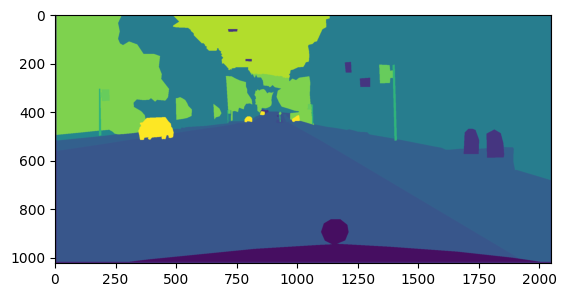

In [4]:
img_path = os.path.join(image_folder, images[110])
img = Image.open(img_path)

plt.imshow(img)
plt.axis('on')

In [5]:
import os
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

### les chemins d'accés

In [6]:
image_path = '/content/drive/MyDrive/data/P8_Cityscapes_leftImg8bit_trainvaltest/leftImg8bit/train/zurich/zurich_000000_000019_leftImg8bit.png'
mask_path  = '/content/drive/MyDrive/data/P8_Cityscapes_gtFine_trainvaltest/gtFine/train/zurich/zurich_000000_000019_gtFine_color.png'

In [7]:
img = Image.open(image_path).convert("RGB")         # Image couleur
mask = Image.open(mask_path)                        # Image en niveaux de gris (Label IDs)

In [8]:
mask_np = np.array(mask)

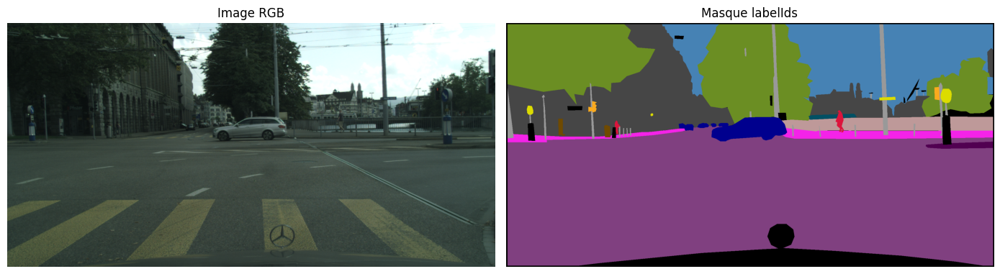

In [9]:
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plt.title("Image RGB")
plt.imshow(img)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("Masque labelIds")
plt.imshow(mask_np, cmap='nipy_spectral')  # Palette colorée pour bien visualiser
plt.axis('off')

plt.tight_layout()
plt.show()

Data generators

Unet mini  
VGG16

Dice_loss, le total_loss, ou balanced_cross_entropy

data augmentation


In [10]:
!pip list

Package                               Version
------------------------------------- -------------------
absl-py                               1.4.0
accelerate                            1.8.1
aiofiles                              24.1.0
aiohappyeyeballs                      2.6.1
aiohttp                               3.11.15
aiosignal                             1.4.0
alabaster                             1.0.0
albucore                              0.0.24
albumentations                        2.0.8
ale-py                                0.11.2
altair                                5.5.0
annotated-types                       0.7.0
antlr4-python3-runtime                4.9.3
anyio                                 4.9.0
argon2-cffi                           25.1.0
argon2-cffi-bindings                  21.2.0
array_record                          0.7.2
arviz                                 0.21.0
astropy                               7.1.0
astropy-iers-data                     0.2025.7.14.0.


## Définition des classes et mapping pour la segmentation


In [11]:
import numpy as np

# Dictionnaire de regroupement (noms uniquement pour info)
class_groups = {
    'flat': ['road', 'sidewalk', 'parking', 'rail track'],
    'human': ['person', 'rider'],
    'vehicle': ['car', 'truck', 'bus', 'on rails', 'motorcycle', 'bicycle', 'caravan', 'trailer'],
    'construction': ['building', 'wall', 'fence', 'guard rail', 'bridge', 'tunnel'],
    'object': ['pole', 'pole group', 'traffic sign', 'traffic light'],
    'nature': ['vegetation', 'terrain'],
    'sky': ['sky'],
    'void': ['unlabeled', 'ego vehicle', 'rectification border', 'out of roi', 'static', 'dynamic', 'ground']
}

# Mapping ID Cityscapes (0 à 33) → ID de groupe (0 à 7)
cityscapes_mapping = {
    0: 7, 1: 7, 2: 7, 3: 7, 4: 7, 5: 7, 6: 7,  # void
    7: 0, 8: 0, 9: 0, 10: 0,                  # flat
    11: 3, 12: 3, 13: 3, 14: 3, 15: 3, 16: 3,  # construction
    17: 4, 18: 4, 19: 4, 20: 4,                # object
    21: 5, 22: 5,                              # nature
    23: 6,                                     # sky
    24: 1, 25: 1,                              # human
    26: 2, 27: 2, 28: 2, 29: 2, 30: 2, 31: 2, 32: 2, 33: 2  # vehicle
}

# Tableau de conversion rapide (masques numpy)
id_to_group = np.zeros(256, dtype=np.uint8)
for id, group_id in cityscapes_mapping.items():
    id_to_group[id] = group_id

# Palette de couleurs pour affichage
group_colors = np.array([
    [128, 64, 128],  # flat
    [220, 20, 60],   # human
    [0, 0, 142],     # vehicle
    [70, 70, 70],    # construction
    [220, 220, 0],   # object
    [107, 142, 35],  # nature
    [70, 130, 180],  # sky
    [0, 0, 0]        # void
], dtype=np.uint8)

group_names = ['flat', 'human', 'vehicle', 'construction', 'object', 'nature', 'sky', 'void']
num_classes = len(group_names)



## Préparation des données


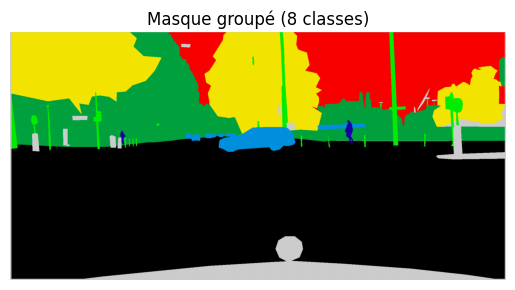

In [12]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

# Chemin vers ton masque Cityscapes
mask_path = "/content/drive/MyDrive/data/P8_Cityscapes_gtFine_trainvaltest/gtFine/train/zurich/zurich_000000_000019_gtFine_labelIds.png"

# Lecture du masque
mask = np.array(Image.open(mask_path))

# Mapping vers les groupes (supposons que id_to_group est déjà défini)
mask_grouped = id_to_group[mask]  # passe de 34 classes → 8 classes

# Affichage
plt.imshow(mask_grouped, cmap='nipy_spectral')
plt.title("Masque groupé (8 classes)")
plt.axis('off')
plt.show()


### Il faut changer de couleur pour les classes



In [13]:
def create_dataset_from_paths(image_paths, mask_paths, batch_size, img_size, augment=False):
    # 🔧 Forcer le type string
    image_paths = list(map(str, image_paths))
    mask_paths = list(map(str, mask_paths))

    path_dataset = tf.data.Dataset.from_tensor_slices((image_paths, mask_paths))

    def load_and_preprocess(img_path, mask_path):
        img = tf.io.read_file(img_path)
        img = tf.image.decode_png(img, channels=3)
        img = tf.image.resize(img, img_size)
        img = tf.cast(img, tf.float32) / 255.0

        mask = tf.io.read_file(mask_path)
        mask = tf.image.decode_png(mask, channels=1)
        mask = tf.image.resize(mask, img_size, method='nearest')
        mask = tf.cast(mask, tf.int32)

        flat_mask = tf.reshape(mask, [-1])
        mapped_mask = tf.gather(id_to_group_tf, flat_mask)
        mask = tf.reshape(mapped_mask, tf.shape(mask))
        mask = tf.squeeze(mask, axis=-1)

        return img, mask

    dataset = path_dataset.map(load_and_preprocess, num_parallel_calls=tf.data.AUTOTUNE)

    if augment:
        def augment_data(image, mask):
            mask = tf.expand_dims(mask, axis=-1)

            # ⚡ Flip horizontal
            if tf.random.uniform(()) > 0.5:
                image = tf.image.flip_left_right(image)
                mask = tf.image.flip_left_right(mask)

            # ⚡ Contraste
            image = tf.image.random_contrast(image, lower=0.8, upper=1.2)

            # ⚡ Luminosité
            image = tf.image.random_brightness(image, max_delta=0.1)

            # ⚡ Rotation 90° / 180° / 270°
            k = tf.random.uniform(shape=[], minval=0, maxval=4, dtype=tf.int32)
            image = tf.image.rot90(image, k)
            mask = tf.image.rot90(mask, k)

            # ⚡ Zoom aléatoire (recadrage)
            def random_crop_zoom(image, mask, zoom_factor=0.9):
                img_shape = tf.shape(image)
                crop_h = tf.cast(tf.cast(img_shape[0], tf.float32) * zoom_factor, tf.int32)
                crop_w = tf.cast(tf.cast(img_shape[1], tf.float32) * zoom_factor, tf.int32)

                combined = tf.concat([image, tf.cast(mask, tf.float32)], axis=-1)
                cropped = tf.image.random_crop(combined, size=[crop_h, crop_w, 4])
                resized = tf.image.resize(cropped, size=[img_shape[0], img_shape[1]])

                return resized[..., :3], tf.cast(resized[..., 3:], tf.int32)

            if tf.random.uniform(()) > 0.5:
                image, mask = random_crop_zoom(image, mask, zoom_factor=0.9)

            image = tf.clip_by_value(image, 0.0, 1.0)
            mask = tf.squeeze(mask, axis=-1)

            return image, mask

        dataset = dataset.map(augment_data, num_parallel_calls=tf.data.AUTOTUNE)

    dataset = dataset.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return dataset


In [14]:
import numpy as np
import tensorflow as tf

# Définir le mapping numpy (déjà fait normalement)
id_to_group = np.zeros(256, dtype=np.uint8)
cityscapes_mapping = {
    0: 7, 1: 7, 2: 7, 3: 7, 4: 7, 5: 7, 6: 7,
    7: 0, 8: 0, 9: 0, 10: 0,
    11: 3, 12: 3, 13: 3, 14: 3, 15: 3, 16: 3,
    17: 4, 18: 4, 19: 4, 20: 4,
    21: 5, 22: 5,
    23: 6,
    24: 1, 25: 1,
    26: 2, 27: 2, 28: 2, 29: 2, 30: 2, 31: 2, 32: 2, 33: 2
}

for cid, gid in cityscapes_mapping.items():
    id_to_group[cid] = gid

# ✅ Convertir en TensorFlow constant
id_to_group_tf = tf.constant(id_to_group, dtype=tf.int32)


In [15]:
def create_dataset_cityscapes(
    leftImg8bit_dir,
    gtFine_dir,
    split='train',
    batch_size=8,
    img_size=(224,224),
    augment=False
):
    import os, tensorflow as tf

    image_paths, mask_paths = [], []

    # Dossiers cityscapes
    img_root  = os.path.join(leftImg8bit_dir, split)
    mask_root = os.path.join(gtFine_dir, split)

    for city in os.listdir(img_root):
        img_city_dir  = os.path.join(img_root, city)
        mask_city_dir = os.path.join(mask_root, city)
        if not os.path.isdir(mask_city_dir):
            continue

        for fname in os.listdir(img_city_dir):
            if fname.endswith("_leftImg8bit.png"):
                img_p = os.path.join(img_city_dir, fname)
                mask_name = fname.replace("_leftImg8bit.png", "_gtFine_labelIds.png")
                mask_p   = os.path.join(mask_city_dir, mask_name)
                if os.path.exists(mask_p):
                    image_paths.append(str(img_p))
                    mask_paths.append(str(mask_p))

    print(f"{split.upper()} ➤ {len(image_paths)} images trouvées")

    # Création du tf.data.Dataset
    ds = tf.data.Dataset.from_tensor_slices((image_paths, mask_paths))

    def _load(img_path, mask_path):
        img = tf.io.read_file(img_path)
        img = tf.image.decode_png(img, channels=3)
        img = tf.image.resize(img, img_size)
        img = tf.cast(img, tf.float32) / 255.0

        mask = tf.io.read_file(mask_path)
        mask = tf.image.decode_png(mask, channels=1)
        mask = tf.image.resize(mask, img_size, method='nearest')
        mask = tf.cast(mask, tf.int32)

        # mapping id_to_group_tf doit exister
        flat = tf.reshape(mask, [-1])
        mapped = tf.gather(id_to_group_tf, flat)
        mask = tf.reshape(mapped, tf.shape(mask))
        mask = tf.squeeze(mask, axis=-1)
        return img, mask

    ds = ds.map(_load, num_parallel_calls=tf.data.AUTOTUNE)

    if augment:
        def _aug(i,m):
            m = tf.expand_dims(m, -1)
            if tf.random.uniform(()) > .5:
                i = tf.image.flip_left_right(i)
                m = tf.image.flip_left_right(m)
            i = tf.clip_by_value(tf.image.random_brightness(i,0.1),0,1)
            m = tf.squeeze(m,-1)
            return i, m
        ds = ds.map(_aug, num_parallel_calls=tf.data.AUTOTUNE)

    return ds.batch(batch_size).prefetch(tf.data.AUTOTUNE)


In [16]:
left_root = "/content/drive/MyDrive/data/P8_Cityscapes_leftImg8bit_trainvaltest/leftImg8bit"
mask_root = "/content/drive/MyDrive/data/P8_Cityscapes_gtFine_trainvaltest/gtFine"
batch_size = 8
img_size = (224, 224)

train_dataset = create_dataset_cityscapes(
    leftImg8bit_dir=left_root,
    gtFine_dir=mask_root,
    split='train',
    batch_size=batch_size,
    img_size=img_size,
    augment=True
)

val_dataset = create_dataset_cityscapes(
    leftImg8bit_dir=left_root,
    gtFine_dir=mask_root,
    split='val',
    batch_size=batch_size,
    img_size=img_size,
    augment=False
)


TRAIN ➤ 2975 images trouvées
VAL ➤ 500 images trouvées


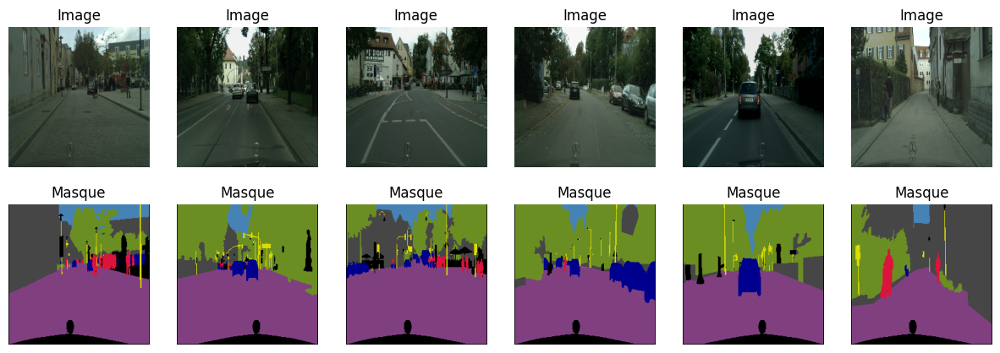

In [17]:
def display_sample_batch(dataset, group_colors, num_images=6):
    import matplotlib.pyplot as plt
    for images, masks in dataset.take(1):
        plt.figure(figsize=(15, 5))
        for i in range(num_images):
            img = images[i].numpy()
            mask = masks[i].numpy()
            mask_rgb = group_colors[mask]
            plt.subplot(2, num_images, i + 1)
            plt.imshow(img)
            plt.axis("off")
            plt.title("Image")
            plt.subplot(2, num_images, i + 1 + num_images)
            plt.imshow(mask_rgb)
            plt.axis("off")
            plt.title("Masque")
        plt.show()

display_sample_batch(train_dataset, group_colors)


## Le modèle U-Net Mini

In [18]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# 🔧 1. Construire U-Net mini
def build_unet_mini(input_shape=(224, 224, 3), num_classes=8):
    inputs = layers.Input(shape=input_shape)

    # Encoder
    c1 = layers.Conv2D(32, 3, activation='relu', padding='same')(inputs)
    c1 = layers.Conv2D(32, 3, activation='relu', padding='same')(c1)
    p1 = layers.MaxPooling2D()(c1)

    c2 = layers.Conv2D(64, 3, activation='relu', padding='same')(p1)
    c2 = layers.Conv2D(64, 3, activation='relu', padding='same')(c2)
    p2 = layers.MaxPooling2D()(c2)

    # Bottleneck
    b = layers.Conv2D(128, 3, activation='relu', padding='same')(p2)
    b = layers.Conv2D(128, 3, activation='relu', padding='same')(b)

    # Decoder
    u1 = layers.UpSampling2D()(b)
    u1 = layers.Concatenate()([u1, c2])
    c3 = layers.Conv2D(64, 3, activation='relu', padding='same')(u1)
    c3 = layers.Conv2D(64, 3, activation='relu', padding='same')(c3)

    u2 = layers.UpSampling2D()(c3)
    u2 = layers.Concatenate()([u2, c1])
    c4 = layers.Conv2D(32, 3, activation='relu', padding='same')(u2)
    c4 = layers.Conv2D(32, 3, activation='relu', padding='same')(c4)

    # Output layer
    outputs = layers.Conv2D(num_classes, 1, activation='softmax')(c4)

    model = models.Model(inputs, outputs)
    return model



In [ ]:
import sys
sys.path.append("/content/drive/MyDrive/Colab Notebooks")

from losses_and_metrics import total_loss, dice_metric, mean_iou
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# 1. Construire le modèle
model = build_unet_mini(input_shape=(224, 224, 3), num_classes=8)

# 2. Compiler avec les métriques personnalisées
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss=total_loss,
    metrics=['accuracy',dice_metric, mean_iou]
)

# 3. Callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True, verbose=1)

model_checkpoint = ModelCheckpoint(
    filepath="/content/drive/MyDrive/segmentation_project/experiments/exp_001_unet/models/best_model.keras",
    monitor='val_loss',
    save_best_only=True,
    verbose=1
)

# 4. Entraînement
history = model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=25,
    callbacks=[early_stopping, model_checkpoint]
)


Epoch 1/25
184/184 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.3528 - dice_metric: 0.2338 - loss: 2.5746 - mean_iou: 0.1000
Epoch 1: val_loss improved from inf to 1.80555, saving model to /content/drive/MyDrive/segmentation_project/experiments/exp_001_unet/models/best_model.keras
184/184 ━━━━━━━━━━━━━━━━━━━━ 971s 5s/step - accuracy: 0.3536 - dice_metric: 0.2344 - loss: 2.5726 - mean_iou: 0.1001 - val_accuracy: 0.5742 - val_dice_metric: 0.4645 - val_loss: 1.8056 - val_mean_iou: 0.2264
Epoch 2/25
184/184 ━━━━━━━━━━━━━━━━━━━━ 0s 976ms/step - accuracy: 0.5903 - dice_metric: 0.4778 - loss: 1.7356 - mean_iou: 0.2416
Epoch 2: val_loss improved from 1.80555 to 1.61569, saving model to /content/drive/MyDrive/segmentation_project/experiments/exp_001_unet/models/best_model.keras
184/184 ━━━━━━━━━━━━━━━━━━━━ 210s 1s/step - accuracy: 0.5904 - dice_metric: 0.4780 - loss: 1.7352 - mean_iou: 0.2417 - val_accuracy: 0.6307 - val_dice_metric: 0.5443 - val_loss: 1.6157 - val_mean_iou: 0.2975
Epoch 3/25


In [ ]:
!ls /content/drive/MyDrive/Colab\ Notebooks/losses_and_metrics.py

'/content/drive/MyDrive/Colab Notebooks/losses_and_metrics.py'


### afficher les courbes loss / accuracy

> Ajouter une citation



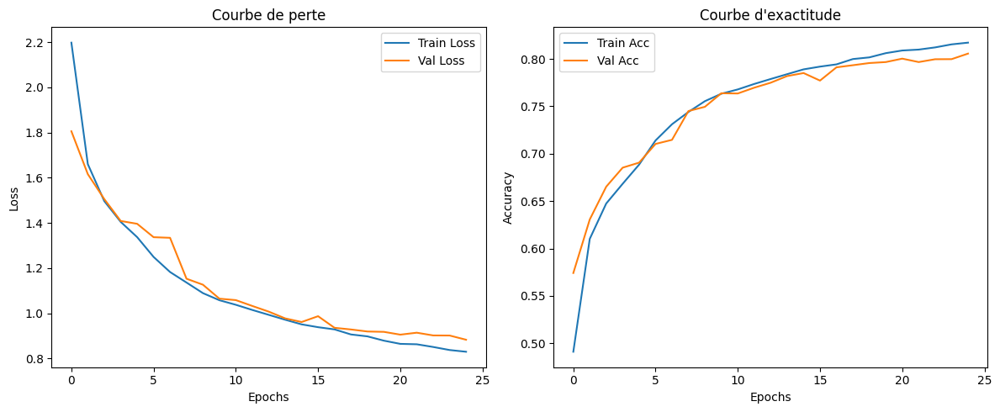

In [ ]:
import matplotlib.pyplot as plt

def plot_training_curves(history):
    """
    Affiche les courbes loss et accuracy d’un entraînement Keras
    """
    # 📈 Courbe de perte
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(history.history["loss"], label="Train Loss")
    plt.plot(history.history["val_loss"], label="Val Loss")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.title("Courbe de perte")
    plt.legend()

    # 📊 Courbe d’exactitude
    plt.subplot(1, 2, 2)
    plt.plot(history.history["accuracy"], label="Train Acc")
    plt.plot(history.history["val_accuracy"], label="Val Acc")
    plt.xlabel("Epochs")
    plt.ylabel("Accuracy")
    plt.title("Courbe d'exactitude")
    plt.legend()

    plt.tight_layout()
    plt.show()

# Appel après l'entraînement :
plot_training_curves(history)


### afficher des prédictions du modèle

> Ajouter une citation



1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


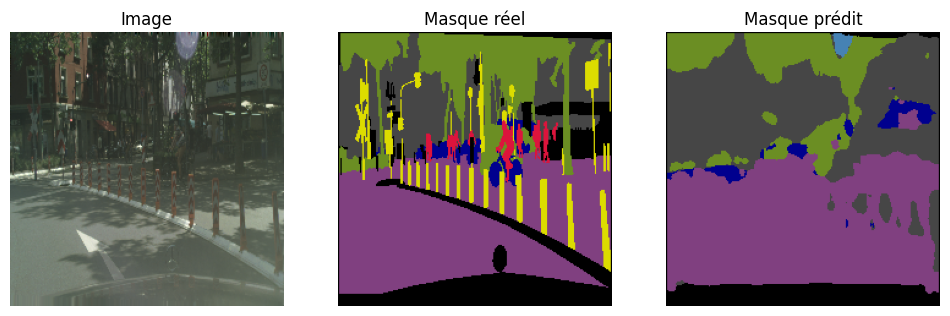

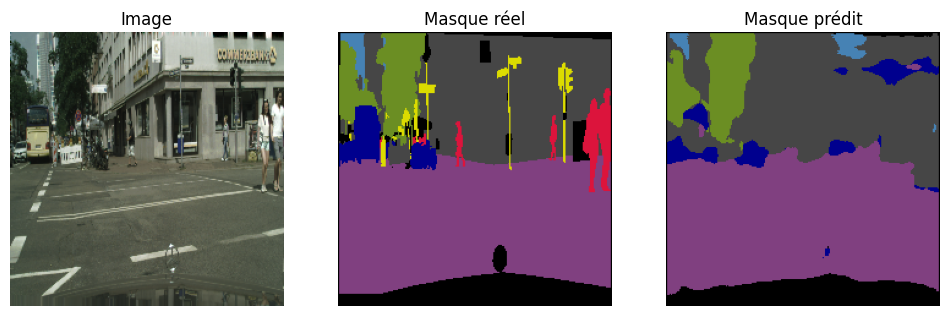

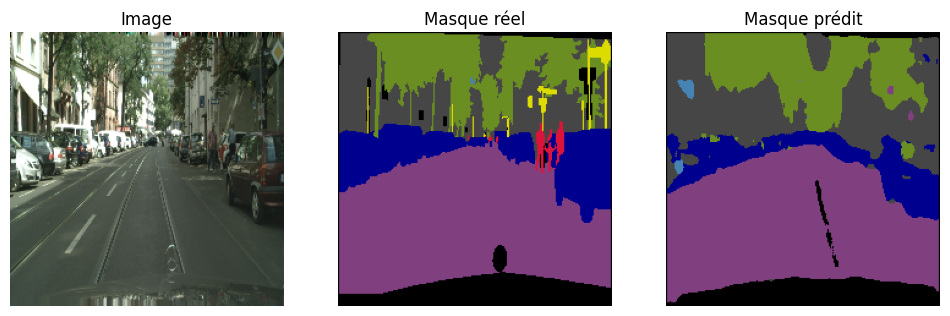

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def visualize_predictions(model, dataset, group_colors, n=3):
    """
    Affiche n exemples d’image + masque réel + prédiction
    """
    for i, (images, masks) in enumerate(dataset.take(n)):
        preds = model.predict(images)

        # Pour chaque image du batch
        for j in range(min(len(images), n)):
            img = images[j].numpy()
            true_mask = masks[j].numpy()
            pred_mask = np.argmax(preds[j], axis=-1)

            # Coloriser les masques avec ta palette
            true_colored = group_colors[true_mask]
            pred_colored = group_colors[pred_mask]

            # Affichage
            plt.figure(figsize=(12, 4))
            plt.subplot(1, 3, 1)
            plt.imshow(img)
            plt.title("Image")
            plt.axis("off")

            plt.subplot(1, 3, 2)
            plt.imshow(true_colored)
            plt.title("Masque réel")
            plt.axis("off")

            plt.subplot(1, 3, 3)
            plt.imshow(pred_colored)
            plt.title("Masque prédit")
            plt.axis("off")

            plt.show()
        break  # Une seule itération (1 batch)

# Appel :
visualize_predictions(model, val_dataset, group_colors, n=3)


In [ ]:
!nvidia-smi

/bin/bash: line 1: nvidia-smi: command not found


### VGG16 classification

In [19]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.applications import VGG16
import numpy as np


In [20]:
# Définir le mapping numpy (déjà fait normalement)
id_to_group = np.zeros(256, dtype=np.uint8)
cityscapes_mapping = {
    0: 7, 1: 7, 2: 7, 3: 7, 4: 7, 5: 7, 6: 7,
    7: 0, 8: 0, 9: 0, 10: 0,
    11: 3, 12: 3, 13: 3, 14: 3, 15: 3, 16: 3,
    17: 4, 18: 4, 19: 4, 20: 4,
    21: 5, 22: 5,
    23: 6,
    24: 1, 25: 1,
    26: 2, 27: 2, 28: 2, 29: 2, 30: 2, 31: 2, 32: 2, 33: 2
}

for cid, gid in cityscapes_mapping.items():
    id_to_group[cid] = gid

# ✅ Convertir en TensorFlow constant
id_to_group_tf = tf.constant(id_to_group, dtype=tf.int32)



In [21]:
def create_dataset_from_paths(image_paths, mask_paths, batch_size, img_size=(224, 224), augment=False):
    image_paths = list(map(str, image_paths))
    mask_paths = list(map(str, mask_paths))

    path_dataset = tf.data.Dataset.from_tensor_slices((image_paths, mask_paths))

    def load_and_preprocess(img_path, mask_path):
        img = tf.io.read_file(img_path)
        img = tf.image.decode_png(img, channels=3)
        img = tf.image.resize(img, img_size)
        img = tf.cast(img, tf.float32) / 255.0

        mask = tf.io.read_file(mask_path)
        mask = tf.image.decode_png(mask, channels=1)
        mask = tf.image.resize(mask, img_size, method='nearest')
        mask = tf.cast(mask, tf.int32)

        flat = tf.reshape(mask, [-1])
        mapped = tf.gather(id_to_group_tf, flat)
        mask = tf.reshape(mapped, tf.shape(mask))
        mask = tf.squeeze(mask, axis=-1)
        return img, mask

    dataset = path_dataset.map(load_and_preprocess, num_parallel_calls=tf.data.AUTOTUNE)

    if augment:
        def augment_data(img, mask):
            mask = tf.expand_dims(mask, axis=-1)
            if tf.random.uniform(()) > 0.5:
                img = tf.image.flip_left_right(img)
                mask = tf.image.flip_left_right(mask)
            mask = tf.squeeze(mask, axis=-1)
            return img, mask

        dataset = dataset.map(augment_data, num_parallel_calls=tf.data.AUTOTUNE)

    return dataset.batch(batch_size).prefetch(tf.data.AUTOTUNE)


In [22]:
from tensorflow.keras import layers, models
from tensorflow.keras.applications import VGG16

def build_unet_vgg16(input_shape=(224, 224, 3), num_classes=8):
    base_model = VGG16(weights='imagenet', include_top=False, input_shape=input_shape)
    base_model.trainable = False

    inputs = base_model.input

    s1 = base_model.get_layer("block1_conv2").output
    s2 = base_model.get_layer("block2_conv2").output
    s3 = base_model.get_layer("block3_conv3").output
    s4 = base_model.get_layer("block4_conv3").output
    b  = base_model.get_layer("block5_conv3").output  # Bottleneck

    # Decoder
    x = layers.Conv2DTranspose(512, 3, strides=2, padding="same")(b)
    x = layers.Concatenate()([x, s4])
    x = layers.Conv2D(512, 3, activation='relu', padding="same")(x)

    x = layers.Conv2DTranspose(256, 3, strides=2, padding="same")(x)
    x = layers.Concatenate()([x, s3])
    x = layers.Conv2D(256, 3, activation='relu', padding="same")(x)

    x = layers.Conv2DTranspose(128, 3, strides=2, padding="same")(x)
    x = layers.Concatenate()([x, s2])
    x = layers.Conv2D(128, 3, activation='relu', padding="same")(x)

    x = layers.Conv2DTranspose(64, 3, strides=2, padding="same")(x)
    x = layers.Concatenate()([x, s1])
    x = layers.Conv2D(64, 3, activation='relu', padding="same")(x)


    outputs = layers.Conv2D(num_classes, 1, activation="softmax")(x)

    model = models.Model(inputs=inputs, outputs=outputs, name="VGG16_UNet")
    return model


In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from losses_and_metrics import dice_metric, mean_iou, total_loss

# 🔧 1. Créer le modèle VGG16 U-Net
model = build_unet_vgg16(input_shape=(224, 224, 3), num_classes=8)

# ✅ 2. Compilation avec les métriques avancées
model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-4),
    loss=total_loss,
    metrics=['accuracy', dice_metric, mean_iou]
)

# 🔁 3. Callbacks
early_stop = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True, verbose=1)

model_ckpt = ModelCheckpoint(
    '/content/drive/MyDrive/unet_vgg16_best.keras',
    monitor='val_loss',
    save_best_only=True,
    verbose=1
)

# 🚀 4. Entraînement
history = model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=25,
    callbacks=[early_stop, model_ckpt]
)


58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/25
184/184 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6003 - dice_metric: 0.5182 - loss: 1.8176 - mean_iou: 0.3332   
Epoch 1: val_loss improved from inf to 0.92966, saving model to /content/drive/MyDrive/unet_vgg16_best.keras
184/184 ━━━━━━━━━━━━━━━━━━━━ 337s 2s/step - accuracy: 0.6010 - dice_metric: 0.5190 - loss: 1.8145 - mean_iou: 0.3335 - val_accuracy: 0.7978 - val_dice_metric: 0.7513 - val_loss: 0.9297 - val_mean_iou: 0.4835
Epoch 2/25
184/184 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.8254 - dice_metric: 0.7718 - loss: 0.8129 - mean_iou: 0.5140
Epoch 2: val_loss improved from 0.92966 to 0.83128, saving model to /content/drive/MyDrive/unet_vgg16_best.keras
184/184 ━━━━━━━━━━━━━━━━━━━━ 277s 1s/step - accuracy: 0.8255 - dice_metric: 0.7718 - loss: 0.8126 - mean_iou: 0.5141 - val_accuracy: 0.8173 - val_dice_metric: 0.7720 - val_loss: 0.8313 - val_mean_iou: 0.5193
Epoch 3/25
184/184 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - acc

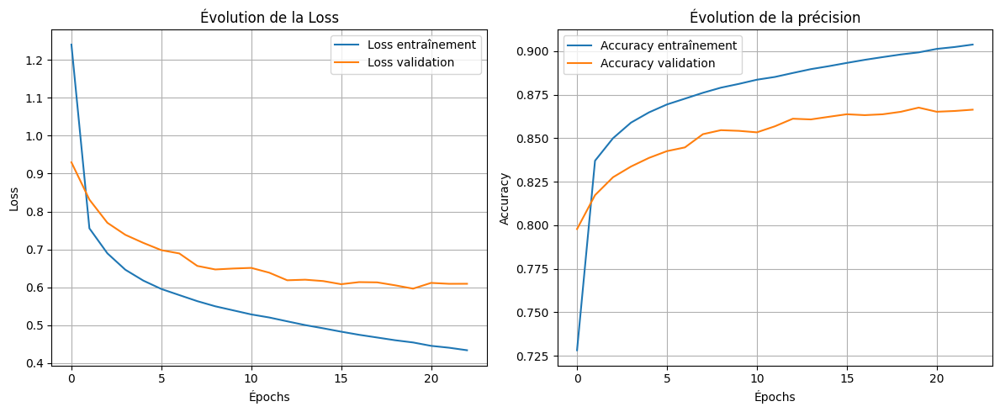

In [ ]:
import matplotlib.pyplot as plt

def plot_training_history(history):
    """
    Affiche les courbes de loss et accuracy pour un modèle Keras
    """
    plt.figure(figsize=(12, 5))

    # Courbe Loss
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Loss entraînement')
    plt.plot(history.history['val_loss'], label='Loss validation')
    plt.xlabel('Épochs')
    plt.ylabel('Loss')
    plt.title('Évolution de la Loss')
    plt.legend()
    plt.grid(True)

    # Courbe Accuracy
    plt.subplot(1, 2, 2)
    if 'accuracy' in history.history:
        plt.plot(history.history['accuracy'], label='Accuracy entraînement')
        plt.plot(history.history['val_accuracy'], label='Accuracy validation')
        plt.ylabel('Accuracy')
        plt.title('Évolution de la précision')
    elif 'sparse_categorical_accuracy' in history.history:
        plt.plot(history.history['sparse_categorical_accuracy'], label='Accuracy entraînement')
        plt.plot(history.history['val_sparse_categorical_accuracy'], label='Accuracy validation')
        plt.ylabel('Sparse Categorical Accuracy')
        plt.title('Évolution de la précision')

    plt.xlabel('Épochs')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()

# ✅ Appel à part (en dehors de la fonction)
plot_training_history(history)


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


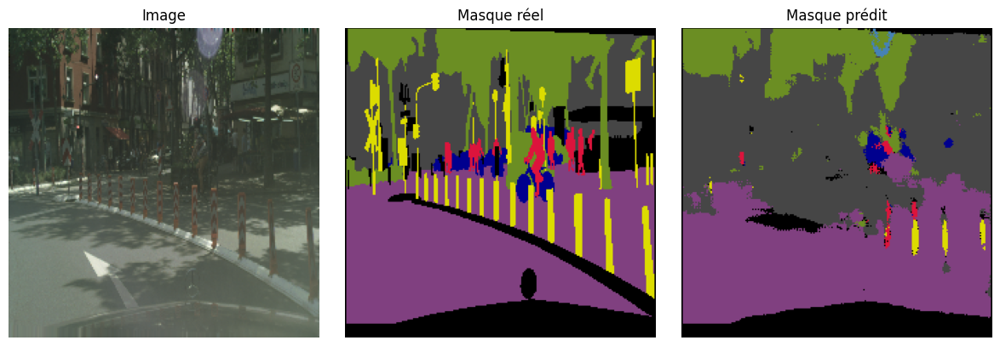

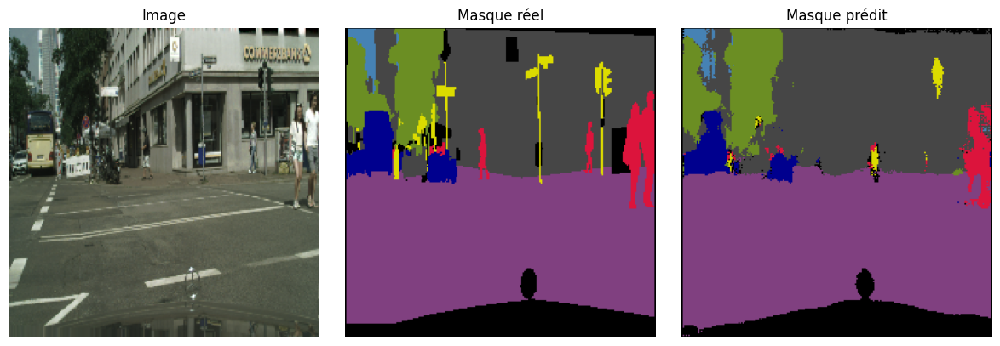

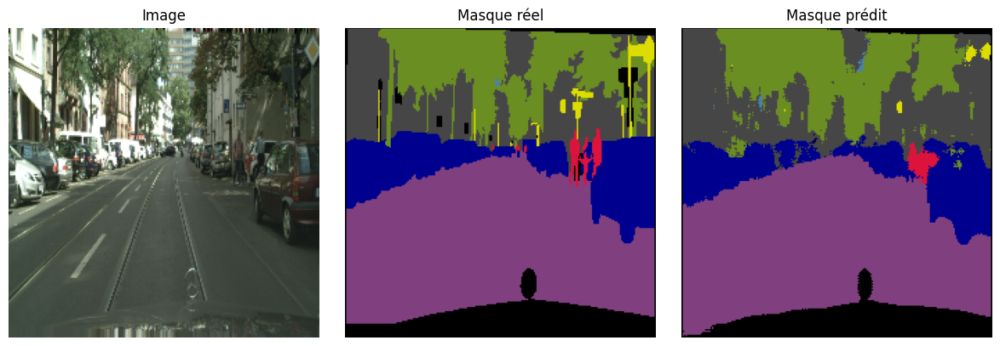

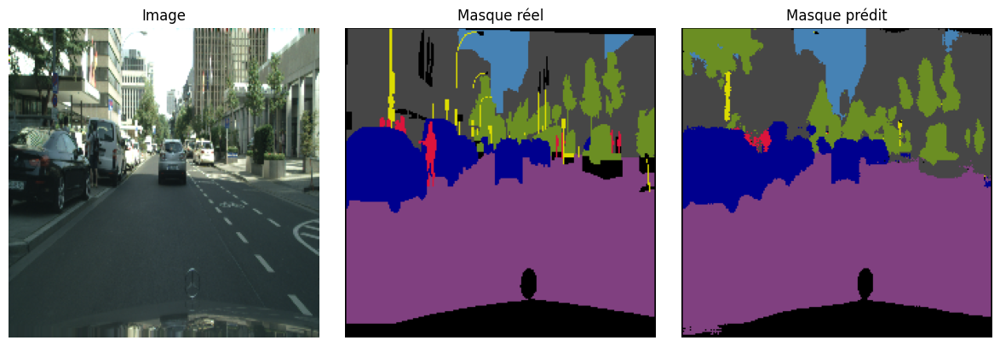

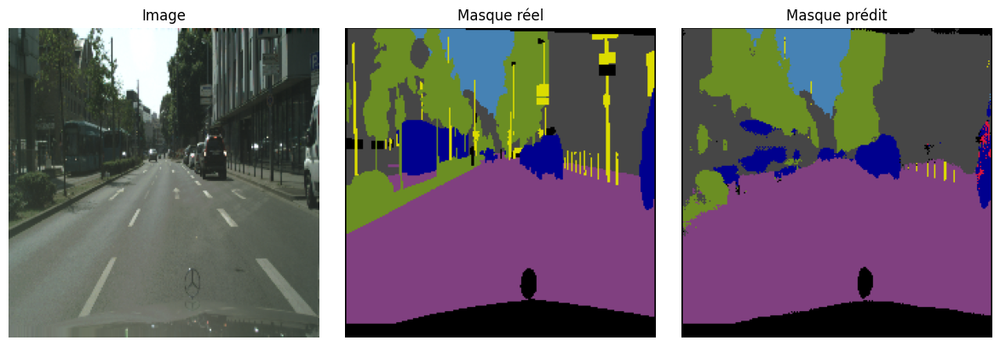

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def display_predictions(model, dataset, id_to_color, num_samples=3):
    """
    Affiche quelques prédictions du modèle U-Net sur un dataset

    Args:
        model: modèle entraîné (ex: VGG16-UNet)
        dataset: un dataset tf.data contenant (image, mask)
        id_to_color: tableau (num_classes, 3) pour la couleur par classe
        num_samples: nombre d'exemples à afficher
    """
    for images, masks in dataset.take(1):
        preds = model.predict(images)
        preds = tf.argmax(preds, axis=-1).numpy()       # (batch, H, W)

        for i in range(num_samples):
            image = images[i].numpy()
            true_mask = masks[i].numpy()
            pred_mask = preds[i]

            # Colorisation
            true_mask_rgb = id_to_color[true_mask]
            pred_mask_rgb = id_to_color[pred_mask]

            # Affichage
            plt.figure(figsize=(12, 4))

            plt.subplot(1, 3, 1)
            plt.imshow(image)
            plt.title("Image")
            plt.axis("off")

            plt.subplot(1, 3, 2)
            plt.imshow(true_mask_rgb)
            plt.title("Masque réel")
            plt.axis("off")

            plt.subplot(1, 3, 3)
            plt.imshow(pred_mask_rgb)
            plt.title("Masque prédit")
            plt.axis("off")

            plt.tight_layout()
            plt.show()
display_predictions(model, val_dataset, group_colors, num_samples=5)

In [ ]:
for images, labels in train_dataset.take(1):
    print(images.shape, images.dtype)
    print(labels.shape, labels.dtype)


(16, 224, 224, 3) <dtype: 'float32'>
(16, 224, 224) <dtype: 'int32'>


In [ ]:
!ls -l losses_and_metrics.py

-rw-r--r-- 1 root root 1193 Jul 10 14:21 losses_and_metrics.py


In [ ]:
import numpy as np

# Nombre de classes (à adapter à ton dataset, ex: 8 pour toi)
num_classes = 8

# Initialisation du compteur
class_counts = np.zeros(num_classes)
total_pixels = 0

# Parcourir tout le dataset d'entraînement
for batch in train_dataset:
    # batch[1] contient les masques
    masks = batch[1].numpy()

    # Comptage des pixels pour chaque classe
    for class_id in range(num_classes):
        class_counts[class_id] += np.sum(masks == class_id)

    total_pixels += np.prod(masks.shape)

# Pourcentage de chaque classe
class_percentages = (class_counts / total_pixels) * 100

# Affichage
for class_id, pct in enumerate(class_percentages):
    print(f"Classe {class_id} : {pct:.2f}% des pixels")


Classe 0 : 38.71% des pixels
Classe 1 : 1.20% des pixels
Classe 2 : 7.31% des pixels
Classe 3 : 21.84% des pixels
Classe 4 : 1.77% des pixels
Classe 5 : 15.08% des pixels
Classe 6 : 3.55% des pixels
Classe 7 : 10.53% des pixels


### VGG16 classification_V2

In [23]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.applications import VGG16
import numpy as np


In [24]:
# Définir le mapping numpy (déjà fait normalement)
id_to_group = np.zeros(256, dtype=np.uint8)
cityscapes_mapping = {
    0: 7, 1: 7, 2: 7, 3: 7, 4: 7, 5: 7, 6: 7,
    7: 0, 8: 0, 9: 0, 10: 0,
    11: 3, 12: 3, 13: 3, 14: 3, 15: 3, 16: 3,
    17: 4, 18: 4, 19: 4, 20: 4,
    21: 5, 22: 5,
    23: 6,
    24: 1, 25: 1,
    26: 2, 27: 2, 28: 2, 29: 2, 30: 2, 31: 2, 32: 2, 33: 2
}

for cid, gid in cityscapes_mapping.items():
    id_to_group[cid] = gid

# ✅ Convertir en TensorFlow constant
id_to_group_tf = tf.constant(id_to_group, dtype=tf.int32)



In [25]:
def create_dataset_from_paths(image_paths, mask_paths, batch_size, img_size=(224, 224), augment=False):
    image_paths = list(map(str, image_paths))
    mask_paths = list(map(str, mask_paths))

    path_dataset = tf.data.Dataset.from_tensor_slices((image_paths, mask_paths))

    def load_and_preprocess(img_path, mask_path):
        img = tf.io.read_file(img_path)
        img = tf.image.decode_png(img, channels=3)
        img = tf.image.resize(img, img_size)
        img = tf.cast(img, tf.float32) / 255.0

        mask = tf.io.read_file(mask_path)
        mask = tf.image.decode_png(mask, channels=1)
        mask = tf.image.resize(mask, img_size, method='nearest')
        mask = tf.cast(mask, tf.int32)

        flat = tf.reshape(mask, [-1])
        mapped = tf.gather(id_to_group_tf, flat)
        mask = tf.reshape(mapped, tf.shape(mask))
        mask = tf.squeeze(mask, axis=-1)
        return img, mask

    dataset = path_dataset.map(load_and_preprocess, num_parallel_calls=tf.data.AUTOTUNE)

    if augment:
        def augment_data(img, mask):
            mask = tf.expand_dims(mask, axis=-1)
            if tf.random.uniform(()) > 0.5:
                img = tf.image.flip_left_right(img)
                mask = tf.image.flip_left_right(mask)
            mask = tf.squeeze(mask, axis=-1)
            return img, mask

        dataset = dataset.map(augment_data, num_parallel_calls=tf.data.AUTOTUNE)

    return dataset.batch(batch_size).prefetch(tf.data.AUTOTUNE)


In [26]:
from tensorflow.keras import layers, models
from tensorflow.keras.applications import VGG16

def build_unet_vgg16(input_shape=(224, 224, 3), num_classes=8):
    base_model = VGG16(weights='imagenet', include_top=False, input_shape=input_shape)
    base_model.trainable = False

    inputs = base_model.input

    s1 = base_model.get_layer("block1_conv2").output
    s2 = base_model.get_layer("block2_conv2").output
    s3 = base_model.get_layer("block3_conv3").output
    s4 = base_model.get_layer("block4_conv3").output
    b  = base_model.get_layer("block5_conv3").output  # Bottleneck

    # Decoder
    x = layers.Conv2DTranspose(512, 3, strides=2, padding="same")(b)
    x = layers.Concatenate()([x, s4])
    x = layers.Conv2D(512, 3, activation='relu', padding="same")(x)

    x = layers.Conv2DTranspose(256, 3, strides=2, padding="same")(x)
    x = layers.Concatenate()([x, s3])
    x = layers.Conv2D(256, 3, activation='relu', padding="same")(x)

    x = layers.Conv2DTranspose(128, 3, strides=2, padding="same")(x)
    x = layers.Concatenate()([x, s2])
    x = layers.Conv2D(128, 3, activation='relu', padding="same")(x)

    x = layers.Conv2DTranspose(64, 3, strides=2, padding="same")(x)
    x = layers.Concatenate()([x, s1])
    x = layers.Conv2D(64, 3, activation='relu', padding="same")(x)


    outputs = layers.Conv2D(num_classes, 1, activation="softmax")(x)

    model = models.Model(inputs=inputs, outputs=outputs, name="VGG16_UNet")
    return model


In [ ]:
import sys
sys.path.append("/content/drive/MyDrive/Colab Notebooks")  # Pour importer le fichier losses_and_metrics

from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from losses_and_metrics import (
    dice_metric,
    dice_loss_metric,
    cross_entropy_metric,
    total_loss
)

# 🔧 1. Créer le modèle VGG16 U-Net
model = build_unet_vgg16(input_shape=(224, 224, 3), num_classes=8)

# ✅ 2. Compilation avec les métriques détaillées
model.compile(
    optimizer=tf.keras.optimizers.Adam(5e-5),
    loss=total_loss,
    metrics=[
        'accuracy',
        dice_metric,
        dice_loss_metric,
        cross_entropy_metric
    ]
)

# 🔁 3. Callbacks
early_stop = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True, verbose=1)
model_ckpt = ModelCheckpoint(
    '/content/drive/MyDrive/unet_vgg16_best.keras',
    monitor='val_loss',
    save_best_only=True,
    verbose=1
)

# 🚀 4. Entraînement
history = model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=40,
    callbacks=[early_stop, model_ckpt]
)


ImportError: cannot import name 'dice_loss_metric' from 'losses_and_metrics' (/content/drive/MyDrive/Colab Notebooks/losses_and_metrics.py)

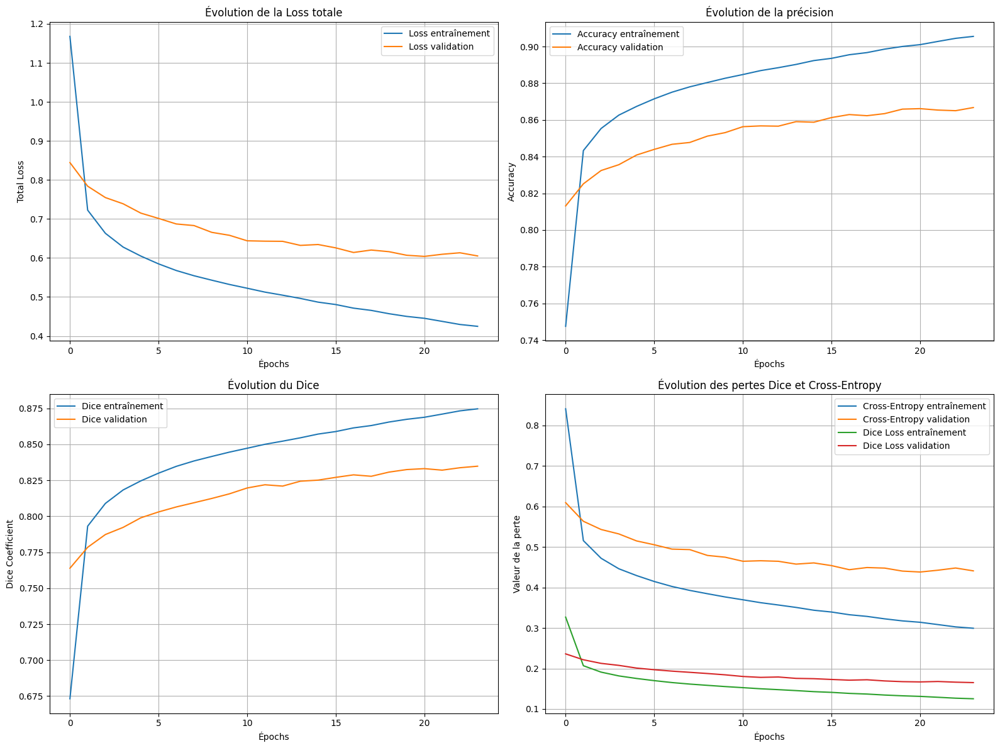

In [ ]:
import matplotlib.pyplot as plt

def plot_full_training_history(history):
    """
    Affiche les courbes complètes de loss, accuracy, dice, cross_entropy et dice_loss
    """
    metrics = history.history.keys()
    plt.figure(figsize=(16, 12))

    # 1. Total Loss
    plt.subplot(2, 2, 1)
    plt.plot(history.history['loss'], label='Loss entraînement')
    plt.plot(history.history['val_loss'], label='Loss validation')
    plt.xlabel('Épochs')
    plt.ylabel('Total Loss')
    plt.title('Évolution de la Loss totale')
    plt.legend()
    plt.grid(True)

    # 2. Accuracy
    plt.subplot(2, 2, 2)
    if 'accuracy' in metrics:
        plt.plot(history.history['accuracy'], label='Accuracy entraînement')
        plt.plot(history.history['val_accuracy'], label='Accuracy validation')
        plt.ylabel('Accuracy')
        plt.title('Évolution de la précision')
        plt.xlabel('Épochs')
        plt.legend()
        plt.grid(True)

    # 3. Dice Score
    if 'dice_metric' in metrics:
        plt.subplot(2, 2, 3)
        plt.plot(history.history['dice_metric'], label='Dice entraînement')
        plt.plot(history.history['val_dice_metric'], label='Dice validation')
        plt.xlabel('Épochs')
        plt.ylabel('Dice Coefficient')
        plt.title('Évolution du Dice')
        plt.legend()
        plt.grid(True)

    # 4. Cross-Entropy et Dice Loss
    if 'cross_entropy_metric' in metrics and 'dice_loss_metric' in metrics:
        plt.subplot(2, 2, 4)
        plt.plot(history.history['cross_entropy_metric'], label='Cross-Entropy entraînement')
        plt.plot(history.history['val_cross_entropy_metric'], label='Cross-Entropy validation')
        plt.plot(history.history['dice_loss_metric'], label='Dice Loss entraînement')
        plt.plot(history.history['val_dice_loss_metric'], label='Dice Loss validation')
        plt.xlabel('Épochs')
        plt.ylabel('Valeur de la perte')
        plt.title('Évolution des pertes Dice et Cross-Entropy')
        plt.legend()
        plt.grid(True)

    plt.tight_layout()
    plt.show()

plot_full_training_history(history)

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


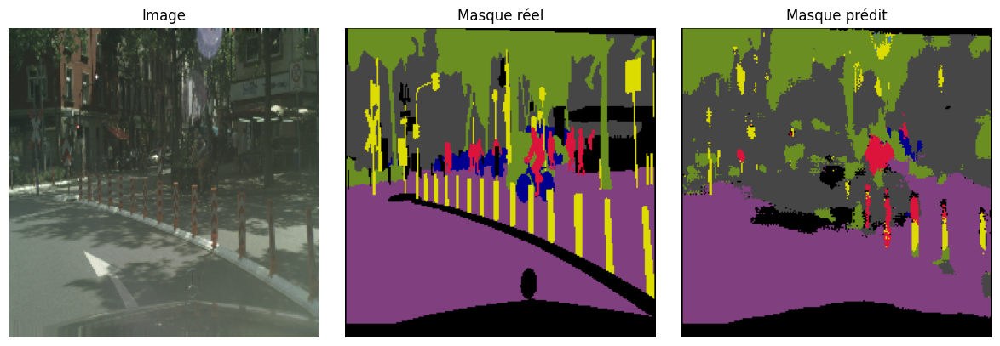

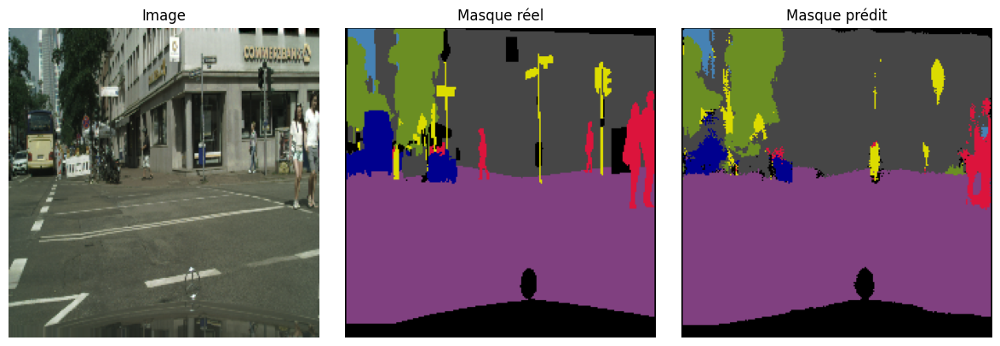

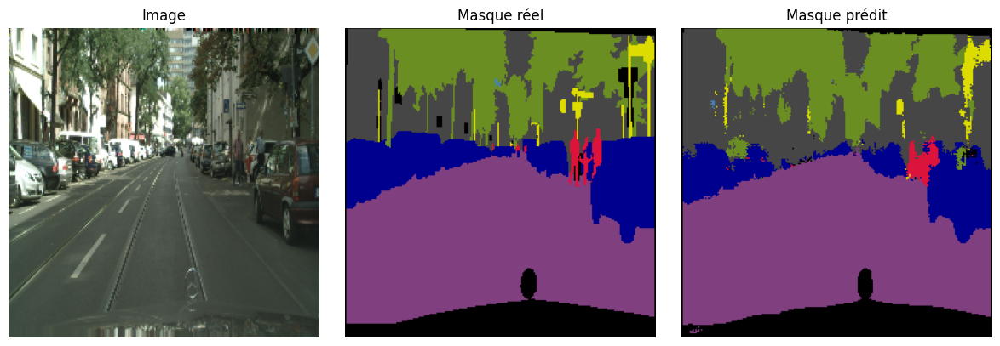

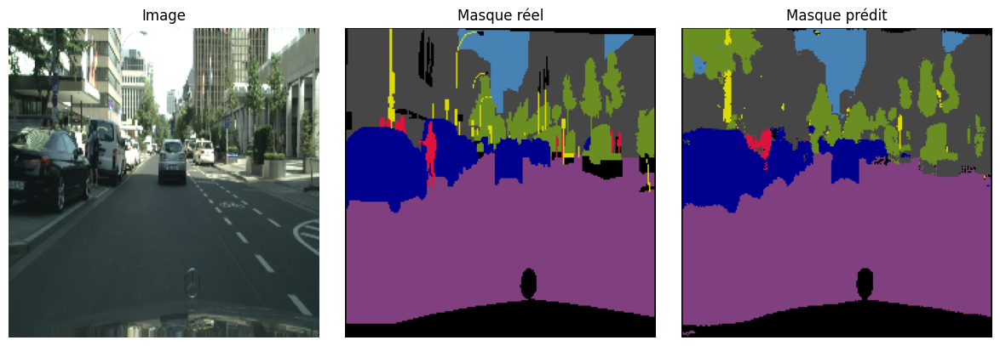

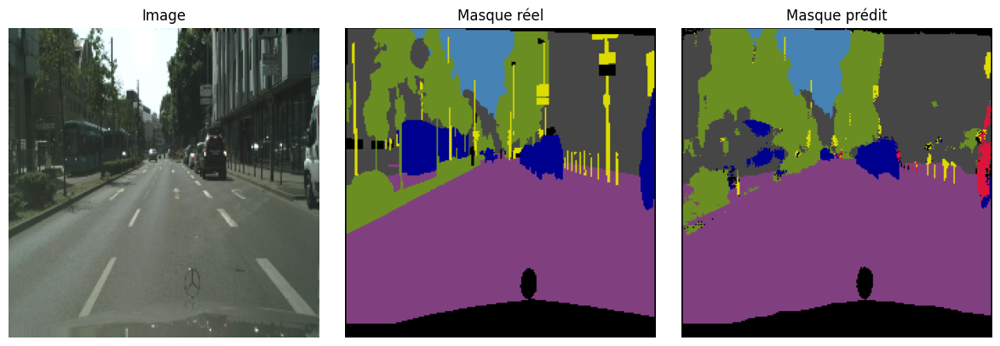

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def display_predictions(model, dataset, id_to_color, num_samples=3):
    """
    Affiche quelques prédictions du modèle U-Net sur un dataset

    Args:
        model: modèle entraîné (ex: VGG16-UNet)
        dataset: un dataset tf.data contenant (image, mask)
        id_to_color: tableau (num_classes, 3) pour la couleur par classe
        num_samples: nombre d'exemples à afficher
    """
    for images, masks in dataset.take(1):
        preds = model.predict(images)
        preds = tf.argmax(preds, axis=-1).numpy()       # (batch, H, W)

        for i in range(num_samples):
            image = images[i].numpy()
            true_mask = masks[i].numpy()
            pred_mask = preds[i]

            # Colorisation
            true_mask_rgb = id_to_color[true_mask]
            pred_mask_rgb = id_to_color[pred_mask]

            # Affichage
            plt.figure(figsize=(12, 4))

            plt.subplot(1, 3, 1)
            plt.imshow(image)
            plt.title("Image")
            plt.axis("off")

            plt.subplot(1, 3, 2)
            plt.imshow(true_mask_rgb)
            plt.title("Masque réel")
            plt.axis("off")

            plt.subplot(1, 3, 3)
            plt.imshow(pred_mask_rgb)
            plt.title("Masque prédit")
            plt.axis("off")

            plt.tight_layout()
            plt.show()
display_predictions(model, val_dataset, group_colors, num_samples=5)

### VGG16 classification_V3

In [27]:
import sys
sys.path.append("/content/drive/MyDrive/Colab Notebooks")  # Pour importer le fichier losses_and_metrics

In [ ]:
!ls /content/drive/MyDrive/Colab\ Notebooks/losses_and_metrics.py

'/content/drive/MyDrive/Colab Notebooks/losses_and_metrics.py'


In [28]:
from losses_and_metrics import dice_metric  # Test d'import

In [ ]:
import sys
sys.path.append("/content/drive/MyDrive/Colab Notebooks")  # Pour importer le fichier losses_and_metrics

from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from losses_and_metrics import (
    dice_metric,
    dice_loss_metric,
    cross_entropy_metric,
    total_loss
)

# 🔧 1. Créer le modèle VGG16 U-Net
model = build_unet_vgg16(input_shape=(224, 224, 3), num_classes=8)

# ✅ 2. Compilation avec les métriques détaillées
model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-5),
    loss=total_loss,
    metrics=[
        'accuracy',
        dice_metric,
        dice_loss_metric,
        cross_entropy_metric
    ]
)

# 🔁 3. Callbacks
early_stop = EarlyStopping(monitor='val_loss', patience=6, restore_best_weights=True, verbose=1)
model_ckpt = ModelCheckpoint(
    '/content/drive/MyDrive/unet_vgg16_best.h5',
    monitor='val_loss',
    save_best_only=True,
    verbose=1
)

# 🚀 4. Entraînement
history = model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=40,
    callbacks=[early_stop, model_ckpt]
)


58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/40
372/372 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.4101 - cross_entropy_metric: 1.9571 - dice_loss_metric: 0.6687 - dice_metric: 0.3313 - loss: 2.6258
Epoch 1: val_loss improved from inf to 1.24767, saving model to /content/drive/MyDrive/unet_vgg16_best.h5


372/372 ━━━━━━━━━━━━━━━━━━━━ 1630s 4s/step - accuracy: 0.4105 - cross_entropy_metric: 1.9556 - dice_loss_metric: 0.6683 - dice_metric: 0.3317 - loss: 2.6239 - val_accuracy: 0.7305 - val_cross_entropy_metric: 0.8975 - val_dice_loss_metric: 0.3509 - val_dice_metric: 0.6491 - val_loss: 1.2477
Epoch 2/40
372/372 ━━━━━━━━━━━━━━━━━━━━ 0s 537ms/step - accuracy: 0.7636 - cross_entropy_metric: 0.7768 - dice_loss_metric: 0.3120 - dice_metric: 0.6880 - loss: 1.0887
Epoch 2: val_loss improved from 1.24767 to 0.99899, saving model to /content/drive/MyDrive/unet_vgg16_best.h5


372/372 ━━━━━━━━━━━━━━━━━━━━ 260s 656ms/step - accuracy: 0.7637 - cross_entropy_metric: 0.7766 - dice_loss_metric: 0.3119 - dice_metric: 0.6881 - loss: 1.0885 - val_accuracy: 0.7837 - val_cross_entropy_metric: 0.7218 - val_dice_loss_metric: 0.2781 - val_dice_metric: 0.7219 - val_loss: 0.9990
Epoch 3/40
372/372 ━━━━━━━━━━━━━━━━━━━━ 0s 555ms/step - accuracy: 0.8035 - cross_entropy_metric: 0.6496 - dice_loss_metric: 0.2590 - dice_metric: 0.7410 - loss: 0.9086
Epoch 3: val_loss improved from 0.99899 to 0.90897, saving model to /content/drive/MyDrive/unet_vgg16_best.h5


372/372 ━━━━━━━━━━━━━━━━━━━━ 257s 690ms/step - accuracy: 0.8035 - cross_entropy_metric: 0.6495 - dice_loss_metric: 0.2589 - dice_metric: 0.7411 - loss: 0.9085 - val_accuracy: 0.8018 - val_cross_entropy_metric: 0.6567 - val_dice_loss_metric: 0.2532 - val_dice_metric: 0.7468 - val_loss: 0.9090
Epoch 4/40
372/372 ━━━━━━━━━━━━━━━━━━━━ 0s 552ms/step - accuracy: 0.8189 - cross_entropy_metric: 0.5988 - dice_loss_metric: 0.2388 - dice_metric: 0.7612 - loss: 0.8376
Epoch 4: val_loss improved from 0.90897 to 0.85658, saving model to /content/drive/MyDrive/unet_vgg16_best.h5


372/372 ━━━━━━━━━━━━━━━━━━━━ 249s 670ms/step - accuracy: 0.8189 - cross_entropy_metric: 0.5987 - dice_loss_metric: 0.2388 - dice_metric: 0.7612 - loss: 0.8375 - val_accuracy: 0.8127 - val_cross_entropy_metric: 0.6183 - val_dice_loss_metric: 0.2392 - val_dice_metric: 0.7608 - val_loss: 0.8566
Epoch 5/40
372/372 ━━━━━━━━━━━━━━━━━━━━ 0s 540ms/step - accuracy: 0.8283 - cross_entropy_metric: 0.5666 - dice_loss_metric: 0.2265 - dice_metric: 0.7735 - loss: 0.7931
Epoch 5: val_loss improved from 0.85658 to 0.82883, saving model to /content/drive/MyDrive/unet_vgg16_best.h5


372/372 ━━━━━━━━━━━━━━━━━━━━ 246s 659ms/step - accuracy: 0.8283 - cross_entropy_metric: 0.5666 - dice_loss_metric: 0.2264 - dice_metric: 0.7736 - loss: 0.7930 - val_accuracy: 0.8182 - val_cross_entropy_metric: 0.5983 - val_dice_loss_metric: 0.2314 - val_dice_metric: 0.7686 - val_loss: 0.8288
Epoch 6/40
372/372 ━━━━━━━━━━━━━━━━━━━━ 0s 549ms/step - accuracy: 0.8344 - cross_entropy_metric: 0.5455 - dice_loss_metric: 0.2184 - dice_metric: 0.7816 - loss: 0.7639
Epoch 6: val_loss improved from 0.82883 to 0.80062, saving model to /content/drive/MyDrive/unet_vgg16_best.h5


372/372 ━━━━━━━━━━━━━━━━━━━━ 249s 669ms/step - accuracy: 0.8344 - cross_entropy_metric: 0.5454 - dice_loss_metric: 0.2184 - dice_metric: 0.7816 - loss: 0.7638 - val_accuracy: 0.8241 - val_cross_entropy_metric: 0.5771 - val_dice_loss_metric: 0.2244 - val_dice_metric: 0.7756 - val_loss: 0.8006
Epoch 7/40
372/372 ━━━━━━━━━━━━━━━━━━━━ 0s 554ms/step - accuracy: 0.8386 - cross_entropy_metric: 0.5298 - dice_loss_metric: 0.2127 - dice_metric: 0.7873 - loss: 0.7425
Epoch 7: val_loss improved from 0.80062 to 0.78771, saving model to /content/drive/MyDrive/unet_vgg16_best.h5


372/372 ━━━━━━━━━━━━━━━━━━━━ 251s 671ms/step - accuracy: 0.8386 - cross_entropy_metric: 0.5297 - dice_loss_metric: 0.2127 - dice_metric: 0.7873 - loss: 0.7424 - val_accuracy: 0.8265 - val_cross_entropy_metric: 0.5684 - val_dice_loss_metric: 0.2203 - val_dice_metric: 0.7797 - val_loss: 0.7877
Epoch 8/40
372/372 ━━━━━━━━━━━━━━━━━━━━ 0s 529ms/step - accuracy: 0.8423 - cross_entropy_metric: 0.5164 - dice_loss_metric: 0.2078 - dice_metric: 0.7922 - loss: 0.7242
Epoch 8: val_loss improved from 0.78771 to 0.76949, saving model to /content/drive/MyDrive/unet_vgg16_best.h5


372/372 ━━━━━━━━━━━━━━━━━━━━ 254s 647ms/step - accuracy: 0.8424 - cross_entropy_metric: 0.5163 - dice_loss_metric: 0.2078 - dice_metric: 0.7922 - loss: 0.7241 - val_accuracy: 0.8303 - val_cross_entropy_metric: 0.5549 - val_dice_loss_metric: 0.2155 - val_dice_metric: 0.7845 - val_loss: 0.7695
Epoch 9/40
372/372 ━━━━━━━━━━━━━━━━━━━━ 0s 528ms/step - accuracy: 0.8458 - cross_entropy_metric: 0.5042 - dice_loss_metric: 0.2033 - dice_metric: 0.7967 - loss: 0.7076
Epoch 9: val_loss improved from 0.76949 to 0.75676, saving model to /content/drive/MyDrive/unet_vgg16_best.h5


372/372 ━━━━━━━━━━━━━━━━━━━━ 250s 621ms/step - accuracy: 0.8458 - cross_entropy_metric: 0.5042 - dice_loss_metric: 0.2033 - dice_metric: 0.7967 - loss: 0.7075 - val_accuracy: 0.8329 - val_cross_entropy_metric: 0.5455 - val_dice_loss_metric: 0.2122 - val_dice_metric: 0.7878 - val_loss: 0.7568
Epoch 10/40
372/372 ━━━━━━━━━━━━━━━━━━━━ 0s 525ms/step - accuracy: 0.8482 - cross_entropy_metric: 0.4949 - dice_loss_metric: 0.2001 - dice_metric: 0.7999 - loss: 0.6950
Epoch 10: val_loss improved from 0.75676 to 0.74605, saving model to /content/drive/MyDrive/unet_vgg16_best.h5


372/372 ━━━━━━━━━━━━━━━━━━━━ 270s 643ms/step - accuracy: 0.8482 - cross_entropy_metric: 0.4949 - dice_loss_metric: 0.2001 - dice_metric: 0.7999 - loss: 0.6950 - val_accuracy: 0.8353 - val_cross_entropy_metric: 0.5383 - val_dice_loss_metric: 0.2087 - val_dice_metric: 0.7913 - val_loss: 0.7461
Epoch 11/40
372/372 ━━━━━━━━━━━━━━━━━━━━ 0s 544ms/step - accuracy: 0.8509 - cross_entropy_metric: 0.4863 - dice_loss_metric: 0.1967 - dice_metric: 0.8033 - loss: 0.6830
Epoch 11: val_loss improved from 0.74605 to 0.74072, saving model to /content/drive/MyDrive/unet_vgg16_best.h5


372/372 ━━━━━━━━━━━━━━━━━━━━ 251s 674ms/step - accuracy: 0.8509 - cross_entropy_metric: 0.4862 - dice_loss_metric: 0.1967 - dice_metric: 0.8033 - loss: 0.6829 - val_accuracy: 0.8362 - val_cross_entropy_metric: 0.5349 - val_dice_loss_metric: 0.2068 - val_dice_metric: 0.7932 - val_loss: 0.7407
Epoch 12/40
372/372 ━━━━━━━━━━━━━━━━━━━━ 0s 526ms/step - accuracy: 0.8525 - cross_entropy_metric: 0.4798 - dice_loss_metric: 0.1945 - dice_metric: 0.8055 - loss: 0.6743
Epoch 12: val_loss improved from 0.74072 to 0.72633, saving model to /content/drive/MyDrive/unet_vgg16_best.h5


372/372 ━━━━━━━━━━━━━━━━━━━━ 241s 644ms/step - accuracy: 0.8526 - cross_entropy_metric: 0.4798 - dice_loss_metric: 0.1944 - dice_metric: 0.8056 - loss: 0.6742 - val_accuracy: 0.8394 - val_cross_entropy_metric: 0.5238 - val_dice_loss_metric: 0.2035 - val_dice_metric: 0.7965 - val_loss: 0.7263
Epoch 13/40
372/372 ━━━━━━━━━━━━━━━━━━━━ 0s 529ms/step - accuracy: 0.8550 - cross_entropy_metric: 0.4711 - dice_loss_metric: 0.1915 - dice_metric: 0.8085 - loss: 0.6626
Epoch 13: val_loss improved from 0.72633 to 0.71875, saving model to /content/drive/MyDrive/unet_vgg16_best.h5


372/372 ━━━━━━━━━━━━━━━━━━━━ 231s 620ms/step - accuracy: 0.8550 - cross_entropy_metric: 0.4711 - dice_loss_metric: 0.1914 - dice_metric: 0.8086 - loss: 0.6625 - val_accuracy: 0.8410 - val_cross_entropy_metric: 0.5185 - val_dice_loss_metric: 0.2012 - val_dice_metric: 0.7988 - val_loss: 0.7188
Epoch 14/40
372/372 ━━━━━━━━━━━━━━━━━━━━ 0s 529ms/step - accuracy: 0.8566 - cross_entropy_metric: 0.4656 - dice_loss_metric: 0.1893 - dice_metric: 0.8107 - loss: 0.6549
Epoch 14: val_loss improved from 0.71875 to 0.70954, saving model to /content/drive/MyDrive/unet_vgg16_best.h5


372/372 ━━━━━━━━━━━━━━━━━━━━ 241s 647ms/step - accuracy: 0.8566 - cross_entropy_metric: 0.4656 - dice_loss_metric: 0.1893 - dice_metric: 0.8107 - loss: 0.6549 - val_accuracy: 0.8430 - val_cross_entropy_metric: 0.5117 - val_dice_loss_metric: 0.1988 - val_dice_metric: 0.8012 - val_loss: 0.7095
Epoch 15/40
372/372 ━━━━━━━━━━━━━━━━━━━━ 0s 537ms/step - accuracy: 0.8585 - cross_entropy_metric: 0.4588 - dice_loss_metric: 0.1869 - dice_metric: 0.8131 - loss: 0.6457
Epoch 15: val_loss improved from 0.70954 to 0.70227, saving model to /content/drive/MyDrive/unet_vgg16_best.h5


372/372 ━━━━━━━━━━━━━━━━━━━━ 246s 661ms/step - accuracy: 0.8585 - cross_entropy_metric: 0.4587 - dice_loss_metric: 0.1869 - dice_metric: 0.8131 - loss: 0.6456 - val_accuracy: 0.8446 - val_cross_entropy_metric: 0.5064 - val_dice_loss_metric: 0.1969 - val_dice_metric: 0.8031 - val_loss: 0.7023
Epoch 16/40
372/372 ━━━━━━━━━━━━━━━━━━━━ 0s 521ms/step - accuracy: 0.8599 - cross_entropy_metric: 0.4539 - dice_loss_metric: 0.1851 - dice_metric: 0.8149 - loss: 0.6390
Epoch 16: val_loss improved from 0.70227 to 0.69695, saving model to /content/drive/MyDrive/unet_vgg16_best.h5


372/372 ━━━━━━━━━━━━━━━━━━━━ 254s 640ms/step - accuracy: 0.8599 - cross_entropy_metric: 0.4539 - dice_loss_metric: 0.1851 - dice_metric: 0.8149 - loss: 0.6390 - val_accuracy: 0.8458 - val_cross_entropy_metric: 0.5027 - val_dice_loss_metric: 0.1952 - val_dice_metric: 0.8048 - val_loss: 0.6970
Epoch 17/40
372/372 ━━━━━━━━━━━━━━━━━━━━ 0s 520ms/step - accuracy: 0.8614 - cross_entropy_metric: 0.4483 - dice_loss_metric: 0.1831 - dice_metric: 0.8169 - loss: 0.6314
Epoch 17: val_loss improved from 0.69695 to 0.69036, saving model to /content/drive/MyDrive/unet_vgg16_best.h5


372/372 ━━━━━━━━━━━━━━━━━━━━ 261s 638ms/step - accuracy: 0.8614 - cross_entropy_metric: 0.4483 - dice_loss_metric: 0.1830 - dice_metric: 0.8170 - loss: 0.6313 - val_accuracy: 0.8472 - val_cross_entropy_metric: 0.4979 - val_dice_loss_metric: 0.1935 - val_dice_metric: 0.8065 - val_loss: 0.6904
Epoch 18/40
372/372 ━━━━━━━━━━━━━━━━━━━━ 0s 534ms/step - accuracy: 0.8629 - cross_entropy_metric: 0.4437 - dice_loss_metric: 0.1813 - dice_metric: 0.8187 - loss: 0.6250
Epoch 18: val_loss improved from 0.69036 to 0.68515, saving model to /content/drive/MyDrive/unet_vgg16_best.h5


372/372 ━━━━━━━━━━━━━━━━━━━━ 243s 652ms/step - accuracy: 0.8629 - cross_entropy_metric: 0.4436 - dice_loss_metric: 0.1813 - dice_metric: 0.8187 - loss: 0.6249 - val_accuracy: 0.8483 - val_cross_entropy_metric: 0.4944 - val_dice_loss_metric: 0.1917 - val_dice_metric: 0.8083 - val_loss: 0.6851
Epoch 19/40
372/372 ━━━━━━━━━━━━━━━━━━━━ 0s 534ms/step - accuracy: 0.8637 - cross_entropy_metric: 0.4400 - dice_loss_metric: 0.1800 - dice_metric: 0.8200 - loss: 0.6199
Epoch 19: val_loss improved from 0.68515 to 0.68054, saving model to /content/drive/MyDrive/unet_vgg16_best.h5


372/372 ━━━━━━━━━━━━━━━━━━━━ 247s 663ms/step - accuracy: 0.8637 - cross_entropy_metric: 0.4399 - dice_loss_metric: 0.1800 - dice_metric: 0.8200 - loss: 0.6199 - val_accuracy: 0.8493 - val_cross_entropy_metric: 0.4911 - val_dice_loss_metric: 0.1905 - val_dice_metric: 0.8095 - val_loss: 0.6805
Epoch 20/40
372/372 ━━━━━━━━━━━━━━━━━━━━ 0s 533ms/step - accuracy: 0.8648 - cross_entropy_metric: 0.4364 - dice_loss_metric: 0.1786 - dice_metric: 0.8214 - loss: 0.6150
Epoch 20: val_loss improved from 0.68054 to 0.67857, saving model to /content/drive/MyDrive/unet_vgg16_best.h5


372/372 ━━━━━━━━━━━━━━━━━━━━ 243s 652ms/step - accuracy: 0.8648 - cross_entropy_metric: 0.4364 - dice_loss_metric: 0.1786 - dice_metric: 0.8214 - loss: 0.6150 - val_accuracy: 0.8497 - val_cross_entropy_metric: 0.4905 - val_dice_loss_metric: 0.1891 - val_dice_metric: 0.8109 - val_loss: 0.6786
Epoch 21/40
372/372 ━━━━━━━━━━━━━━━━━━━━ 0s 534ms/step - accuracy: 0.8660 - cross_entropy_metric: 0.4322 - dice_loss_metric: 0.1770 - dice_metric: 0.8230 - loss: 0.6092
Epoch 21: val_loss improved from 0.67857 to 0.67564, saving model to /content/drive/MyDrive/unet_vgg16_best.h5


372/372 ━━━━━━━━━━━━━━━━━━━━ 243s 652ms/step - accuracy: 0.8660 - cross_entropy_metric: 0.4322 - dice_loss_metric: 0.1770 - dice_metric: 0.8230 - loss: 0.6092 - val_accuracy: 0.8504 - val_cross_entropy_metric: 0.4885 - val_dice_loss_metric: 0.1882 - val_dice_metric: 0.8118 - val_loss: 0.6756
Epoch 22/40
372/372 ━━━━━━━━━━━━━━━━━━━━ 0s 518ms/step - accuracy: 0.8676 - cross_entropy_metric: 0.4277 - dice_loss_metric: 0.1751 - dice_metric: 0.8249 - loss: 0.6028
Epoch 22: val_loss improved from 0.67564 to 0.66749, saving model to /content/drive/MyDrive/unet_vgg16_best.h5


372/372 ━━━━━━━━━━━━━━━━━━━━ 247s 614ms/step - accuracy: 0.8676 - cross_entropy_metric: 0.4276 - dice_loss_metric: 0.1751 - dice_metric: 0.8249 - loss: 0.6028 - val_accuracy: 0.8521 - val_cross_entropy_metric: 0.4820 - val_dice_loss_metric: 0.1865 - val_dice_metric: 0.8135 - val_loss: 0.6675
Epoch 23/40
372/372 ━━━━━━━━━━━━━━━━━━━━ 0s 528ms/step - accuracy: 0.8681 - cross_entropy_metric: 0.4247 - dice_loss_metric: 0.1743 - dice_metric: 0.8257 - loss: 0.5990
Epoch 23: val_loss improved from 0.66749 to 0.66245, saving model to /content/drive/MyDrive/unet_vgg16_best.h5


372/372 ━━━━━━━━━━━━━━━━━━━━ 274s 646ms/step - accuracy: 0.8681 - cross_entropy_metric: 0.4247 - dice_loss_metric: 0.1743 - dice_metric: 0.8257 - loss: 0.5990 - val_accuracy: 0.8532 - val_cross_entropy_metric: 0.4783 - val_dice_loss_metric: 0.1852 - val_dice_metric: 0.8148 - val_loss: 0.6624
Epoch 24/40
372/372 ━━━━━━━━━━━━━━━━━━━━ 0s 543ms/step - accuracy: 0.8694 - cross_entropy_metric: 0.4209 - dice_loss_metric: 0.1728 - dice_metric: 0.8272 - loss: 0.5937
Epoch 24: val_loss did not improve from 0.66245
372/372 ━━━━━━━━━━━━━━━━━━━━ 244s 653ms/step - accuracy: 0.8694 - cross_entropy_metric: 0.4209 - dice_loss_metric: 0.1728 - dice_metric: 0.8272 - loss: 0.5936 - val_accuracy: 0.8528 - val_cross_entropy_metric: 0.4808 - val_dice_loss_metric: 0.1848 - val_dice_metric: 0.8152 - val_loss: 0.6645
Epoch 25/40
372/372 ━━━━━━━━━━━━━━━━━━━━ 0s 525ms/step - accuracy: 0.8697 - cross_entropy_metric: 0.4191 - dice_loss_metric: 0.1721 - dice_metric: 0.8279 - loss: 0.5911
Epoch 25: val_loss improved 

372/372 ━━━━━━━━━━━━━━━━━━━━ 244s 655ms/step - accuracy: 0.8697 - cross_entropy_metric: 0.4190 - dice_loss_metric: 0.1721 - dice_metric: 0.8279 - loss: 0.5911 - val_accuracy: 0.8543 - val_cross_entropy_metric: 0.4754 - val_dice_loss_metric: 0.1833 - val_dice_metric: 0.8167 - val_loss: 0.6577
Epoch 26/40
372/372 ━━━━━━━━━━━━━━━━━━━━ 0s 532ms/step - accuracy: 0.8709 - cross_entropy_metric: 0.4154 - dice_loss_metric: 0.1706 - dice_metric: 0.8294 - loss: 0.5860
Epoch 26: val_loss improved from 0.65770 to 0.65432, saving model to /content/drive/MyDrive/unet_vgg16_best.h5


372/372 ━━━━━━━━━━━━━━━━━━━━ 246s 661ms/step - accuracy: 0.8709 - cross_entropy_metric: 0.4153 - dice_loss_metric: 0.1706 - dice_metric: 0.8294 - loss: 0.5859 - val_accuracy: 0.8550 - val_cross_entropy_metric: 0.4735 - val_dice_loss_metric: 0.1818 - val_dice_metric: 0.8182 - val_loss: 0.6543
Epoch 27/40
372/372 ━━━━━━━━━━━━━━━━━━━━ 0s 546ms/step - accuracy: 0.8715 - cross_entropy_metric: 0.4127 - dice_loss_metric: 0.1697 - dice_metric: 0.8303 - loss: 0.5823
Epoch 27: val_loss improved from 0.65432 to 0.64910, saving model to /content/drive/MyDrive/unet_vgg16_best.h5


372/372 ━━━━━━━━━━━━━━━━━━━━ 249s 670ms/step - accuracy: 0.8715 - cross_entropy_metric: 0.4126 - dice_loss_metric: 0.1697 - dice_metric: 0.8303 - loss: 0.5823 - val_accuracy: 0.8562 - val_cross_entropy_metric: 0.4691 - val_dice_loss_metric: 0.1810 - val_dice_metric: 0.8190 - val_loss: 0.6491
Epoch 28/40
372/372 ━━━━━━━━━━━━━━━━━━━━ 0s 515ms/step - accuracy: 0.8724 - cross_entropy_metric: 0.4103 - dice_loss_metric: 0.1687 - dice_metric: 0.8313 - loss: 0.5790
Epoch 28: val_loss improved from 0.64910 to 0.64797, saving model to /content/drive/MyDrive/unet_vgg16_best.h5


372/372 ━━━━━━━━━━━━━━━━━━━━ 238s 606ms/step - accuracy: 0.8724 - cross_entropy_metric: 0.4103 - dice_loss_metric: 0.1687 - dice_metric: 0.8313 - loss: 0.5790 - val_accuracy: 0.8563 - val_cross_entropy_metric: 0.4686 - val_dice_loss_metric: 0.1804 - val_dice_metric: 0.8196 - val_loss: 0.6480
Epoch 29/40
372/372 ━━━━━━━━━━━━━━━━━━━━ 0s 545ms/step - accuracy: 0.8733 - cross_entropy_metric: 0.4071 - dice_loss_metric: 0.1676 - dice_metric: 0.8324 - loss: 0.5746
Epoch 29: val_loss improved from 0.64797 to 0.64444, saving model to /content/drive/MyDrive/unet_vgg16_best.h5


372/372 ━━━━━━━━━━━━━━━━━━━━ 249s 667ms/step - accuracy: 0.8733 - cross_entropy_metric: 0.4070 - dice_loss_metric: 0.1675 - dice_metric: 0.8325 - loss: 0.5746 - val_accuracy: 0.8571 - val_cross_entropy_metric: 0.4659 - val_dice_loss_metric: 0.1796 - val_dice_metric: 0.8204 - val_loss: 0.6444
Epoch 30/40
372/372 ━━━━━━━━━━━━━━━━━━━━ 0s 526ms/step - accuracy: 0.8742 - cross_entropy_metric: 0.4041 - dice_loss_metric: 0.1665 - dice_metric: 0.8335 - loss: 0.5706
Epoch 30: val_loss improved from 0.64444 to 0.64238, saving model to /content/drive/MyDrive/unet_vgg16_best.h5


372/372 ━━━━━━━━━━━━━━━━━━━━ 242s 648ms/step - accuracy: 0.8742 - cross_entropy_metric: 0.4041 - dice_loss_metric: 0.1665 - dice_metric: 0.8335 - loss: 0.5705 - val_accuracy: 0.8576 - val_cross_entropy_metric: 0.4650 - val_dice_loss_metric: 0.1784 - val_dice_metric: 0.8216 - val_loss: 0.6424
Epoch 31/40
372/372 ━━━━━━━━━━━━━━━━━━━━ 0s 539ms/step - accuracy: 0.8746 - cross_entropy_metric: 0.4021 - dice_loss_metric: 0.1657 - dice_metric: 0.8343 - loss: 0.5678
Epoch 31: val_loss improved from 0.64238 to 0.64033, saving model to /content/drive/MyDrive/unet_vgg16_best.h5


372/372 ━━━━━━━━━━━━━━━━━━━━ 236s 629ms/step - accuracy: 0.8746 - cross_entropy_metric: 0.4021 - dice_loss_metric: 0.1657 - dice_metric: 0.8343 - loss: 0.5678 - val_accuracy: 0.8580 - val_cross_entropy_metric: 0.4636 - val_dice_loss_metric: 0.1777 - val_dice_metric: 0.8223 - val_loss: 0.6403
Epoch 32/40
372/372 ━━━━━━━━━━━━━━━━━━━━ 0s 537ms/step - accuracy: 0.8753 - cross_entropy_metric: 0.4000 - dice_loss_metric: 0.1649 - dice_metric: 0.8351 - loss: 0.5649
Epoch 32: val_loss did not improve from 0.64033
372/372 ━━━━━━━━━━━━━━━━━━━━ 242s 648ms/step - accuracy: 0.8753 - cross_entropy_metric: 0.4000 - dice_loss_metric: 0.1649 - dice_metric: 0.8351 - loss: 0.5649 - val_accuracy: 0.8575 - val_cross_entropy_metric: 0.4663 - val_dice_loss_metric: 0.1776 - val_dice_metric: 0.8224 - val_loss: 0.6428
Epoch 33/40
372/372 ━━━━━━━━━━━━━━━━━━━━ 0s 526ms/step - accuracy: 0.8756 - cross_entropy_metric: 0.3983 - dice_loss_metric: 0.1642 - dice_metric: 0.8358 - loss: 0.5625
Epoch 33: val_loss improved 

372/372 ━━━━━━━━━━━━━━━━━━━━ 240s 645ms/step - accuracy: 0.8756 - cross_entropy_metric: 0.3982 - dice_loss_metric: 0.1642 - dice_metric: 0.8358 - loss: 0.5624 - val_accuracy: 0.8591 - val_cross_entropy_metric: 0.4608 - val_dice_loss_metric: 0.1760 - val_dice_metric: 0.8240 - val_loss: 0.6357
Epoch 34/40
372/372 ━━━━━━━━━━━━━━━━━━━━ 0s 534ms/step - accuracy: 0.8766 - cross_entropy_metric: 0.3951 - dice_loss_metric: 0.1631 - dice_metric: 0.8369 - loss: 0.5582
Epoch 34: val_loss improved from 0.63574 to 0.63321, saving model to /content/drive/MyDrive/unet_vgg16_best.h5


372/372 ━━━━━━━━━━━━━━━━━━━━ 244s 653ms/step - accuracy: 0.8766 - cross_entropy_metric: 0.3950 - dice_loss_metric: 0.1631 - dice_metric: 0.8369 - loss: 0.5581 - val_accuracy: 0.8596 - val_cross_entropy_metric: 0.4587 - val_dice_loss_metric: 0.1755 - val_dice_metric: 0.8245 - val_loss: 0.6332
Epoch 35/40
372/372 ━━━━━━━━━━━━━━━━━━━━ 0s 536ms/step - accuracy: 0.8774 - cross_entropy_metric: 0.3926 - dice_loss_metric: 0.1622 - dice_metric: 0.8378 - loss: 0.5548
Epoch 35: val_loss improved from 0.63321 to 0.63164, saving model to /content/drive/MyDrive/unet_vgg16_best.h5


372/372 ━━━━━━━━━━━━━━━━━━━━ 247s 661ms/step - accuracy: 0.8774 - cross_entropy_metric: 0.3926 - dice_loss_metric: 0.1622 - dice_metric: 0.8379 - loss: 0.5547 - val_accuracy: 0.8599 - val_cross_entropy_metric: 0.4579 - val_dice_loss_metric: 0.1748 - val_dice_metric: 0.8252 - val_loss: 0.6316
Epoch 36/40
372/372 ━━━━━━━━━━━━━━━━━━━━ 0s 534ms/step - accuracy: 0.8778 - cross_entropy_metric: 0.3913 - dice_loss_metric: 0.1615 - dice_metric: 0.8385 - loss: 0.5528
Epoch 36: val_loss improved from 0.63164 to 0.62795, saving model to /content/drive/MyDrive/unet_vgg16_best.h5


372/372 ━━━━━━━━━━━━━━━━━━━━ 261s 656ms/step - accuracy: 0.8778 - cross_entropy_metric: 0.3913 - dice_loss_metric: 0.1615 - dice_metric: 0.8385 - loss: 0.5528 - val_accuracy: 0.8607 - val_cross_entropy_metric: 0.4547 - val_dice_loss_metric: 0.1742 - val_dice_metric: 0.8257 - val_loss: 0.6279
Epoch 37/40
372/372 ━━━━━━━━━━━━━━━━━━━━ 0s 536ms/step - accuracy: 0.8783 - cross_entropy_metric: 0.3882 - dice_loss_metric: 0.1608 - dice_metric: 0.8392 - loss: 0.5490
Epoch 37: val_loss improved from 0.62795 to 0.62425, saving model to /content/drive/MyDrive/unet_vgg16_best.h5


372/372 ━━━━━━━━━━━━━━━━━━━━ 236s 635ms/step - accuracy: 0.8783 - cross_entropy_metric: 0.3881 - dice_loss_metric: 0.1608 - dice_metric: 0.8392 - loss: 0.5489 - val_accuracy: 0.8616 - val_cross_entropy_metric: 0.4524 - val_dice_loss_metric: 0.1729 - val_dice_metric: 0.8271 - val_loss: 0.6242
Epoch 38/40
372/372 ━━━━━━━━━━━━━━━━━━━━ 0s 542ms/step - accuracy: 0.8788 - cross_entropy_metric: 0.3875 - dice_loss_metric: 0.1602 - dice_metric: 0.8398 - loss: 0.5477
Epoch 38: val_loss improved from 0.62425 to 0.62325, saving model to /content/drive/MyDrive/unet_vgg16_best.h5


372/372 ━━━━━━━━━━━━━━━━━━━━ 246s 660ms/step - accuracy: 0.8788 - cross_entropy_metric: 0.3874 - dice_loss_metric: 0.1602 - dice_metric: 0.8398 - loss: 0.5476 - val_accuracy: 0.8618 - val_cross_entropy_metric: 0.4518 - val_dice_loss_metric: 0.1724 - val_dice_metric: 0.8276 - val_loss: 0.6233
Epoch 39/40
372/372 ━━━━━━━━━━━━━━━━━━━━ 0s 527ms/step - accuracy: 0.8797 - cross_entropy_metric: 0.3843 - dice_loss_metric: 0.1590 - dice_metric: 0.8410 - loss: 0.5433
Epoch 39: val_loss improved from 0.62325 to 0.62057, saving model to /content/drive/MyDrive/unet_vgg16_best.h5


372/372 ━━━━━━━━━━━━━━━━━━━━ 256s 645ms/step - accuracy: 0.8797 - cross_entropy_metric: 0.3843 - dice_loss_metric: 0.1590 - dice_metric: 0.8410 - loss: 0.5433 - val_accuracy: 0.8624 - val_cross_entropy_metric: 0.4496 - val_dice_loss_metric: 0.1720 - val_dice_metric: 0.8280 - val_loss: 0.6206
Epoch 40/40
372/372 ━━━━━━━━━━━━━━━━━━━━ 0s 535ms/step - accuracy: 0.8802 - cross_entropy_metric: 0.3823 - dice_loss_metric: 0.1584 - dice_metric: 0.8416 - loss: 0.5408
Epoch 40: val_loss did not improve from 0.62057
372/372 ━━━━━━━━━━━━━━━━━━━━ 241s 646ms/step - accuracy: 0.8802 - cross_entropy_metric: 0.3823 - dice_loss_metric: 0.1584 - dice_metric: 0.8416 - loss: 0.5407 - val_accuracy: 0.8622 - val_cross_entropy_metric: 0.4510 - val_dice_loss_metric: 0.1714 - val_dice_metric: 0.8286 - val_loss: 0.6214
Restoring model weights from the end of the best epoch: 39.


In [ ]:
1+1+1+1+1+1+1+1dddddddfdhffhcchddffdhfffhvvfdhhggffjjj

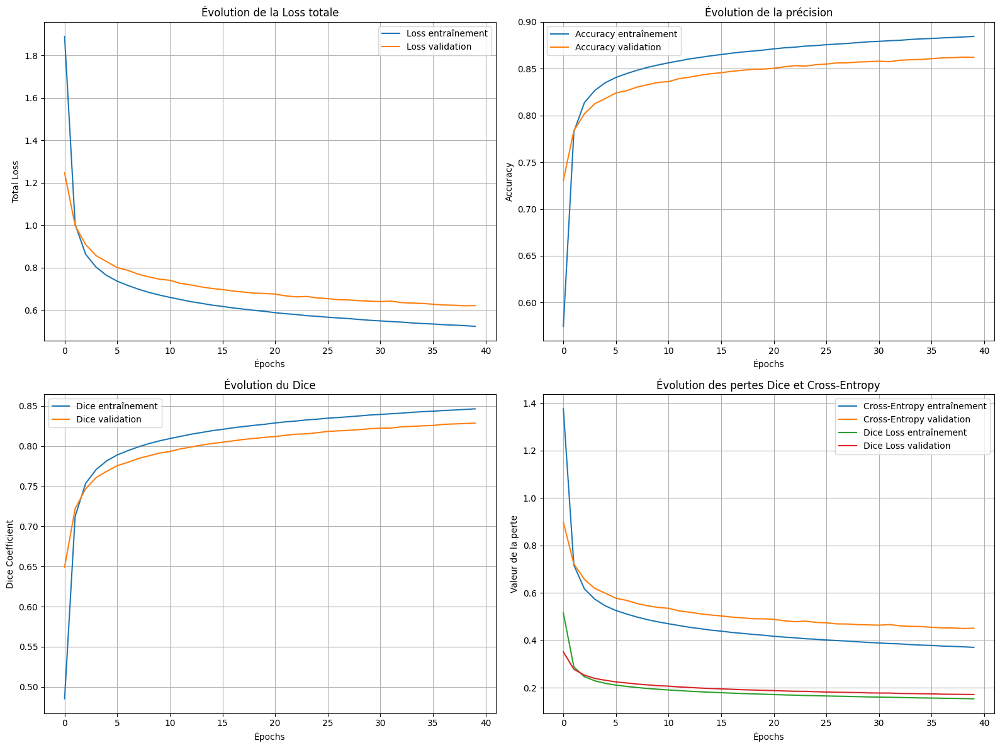

In [ ]:
import matplotlib.pyplot as plt

def plot_full_training_history(history):
    """
    Affiche les courbes complètes de loss, accuracy, dice, cross_entropy et dice_loss
    """
    metrics = history.history.keys()
    plt.figure(figsize=(16, 12))

    # 1. Total Loss
    plt.subplot(2, 2, 1)
    plt.plot(history.history['loss'], label='Loss entraînement')
    plt.plot(history.history['val_loss'], label='Loss validation')
    plt.xlabel('Épochs')
    plt.ylabel('Total Loss')
    plt.title('Évolution de la Loss totale')
    plt.legend()
    plt.grid(True)

    # 2. Accuracy
    plt.subplot(2, 2, 2)
    if 'accuracy' in metrics:
        plt.plot(history.history['accuracy'], label='Accuracy entraînement')
        plt.plot(history.history['val_accuracy'], label='Accuracy validation')
        plt.ylabel('Accuracy')
        plt.title('Évolution de la précision')
        plt.xlabel('Épochs')
        plt.legend()
        plt.grid(True)

    # 3. Dice Score
    if 'dice_metric' in metrics:
        plt.subplot(2, 2, 3)
        plt.plot(history.history['dice_metric'], label='Dice entraînement')
        plt.plot(history.history['val_dice_metric'], label='Dice validation')
        plt.xlabel('Épochs')
        plt.ylabel('Dice Coefficient')
        plt.title('Évolution du Dice')
        plt.legend()
        plt.grid(True)

    # 4. Cross-Entropy et Dice Loss
    if 'cross_entropy_metric' in metrics and 'dice_loss_metric' in metrics:
        plt.subplot(2, 2, 4)
        plt.plot(history.history['cross_entropy_metric'], label='Cross-Entropy entraînement')
        plt.plot(history.history['val_cross_entropy_metric'], label='Cross-Entropy validation')
        plt.plot(history.history['dice_loss_metric'], label='Dice Loss entraînement')
        plt.plot(history.history['val_dice_loss_metric'], label='Dice Loss validation')
        plt.xlabel('Épochs')
        plt.ylabel('Valeur de la perte')
        plt.title('Évolution des pertes Dice et Cross-Entropy')
        plt.legend()
        plt.grid(True)

    plt.tight_layout()
    plt.show()

plot_full_training_history(history)

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


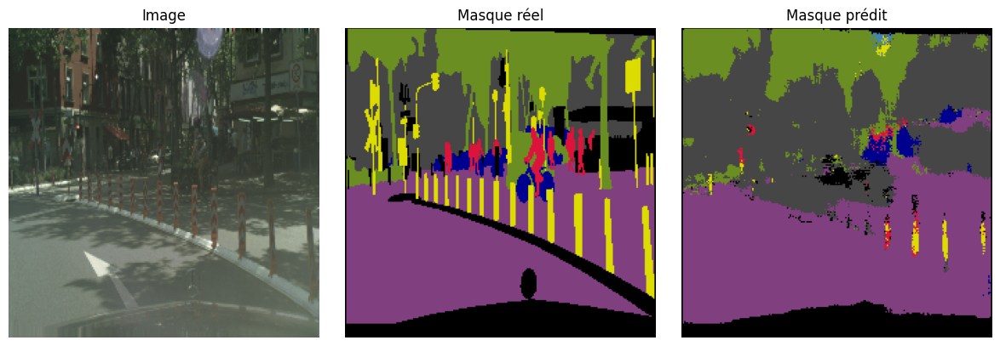

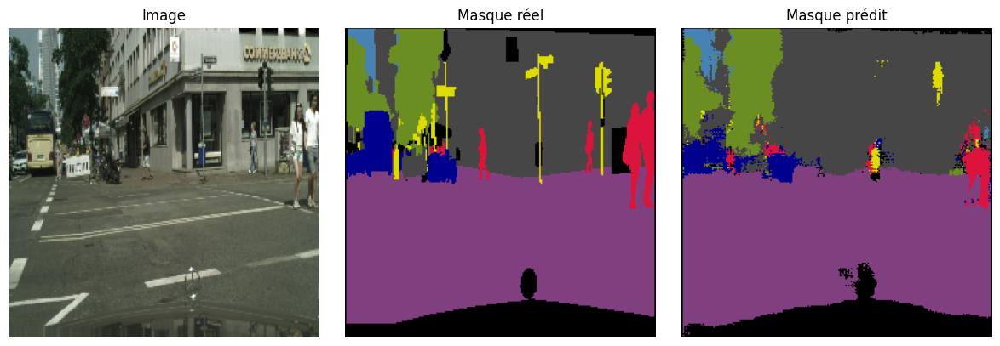

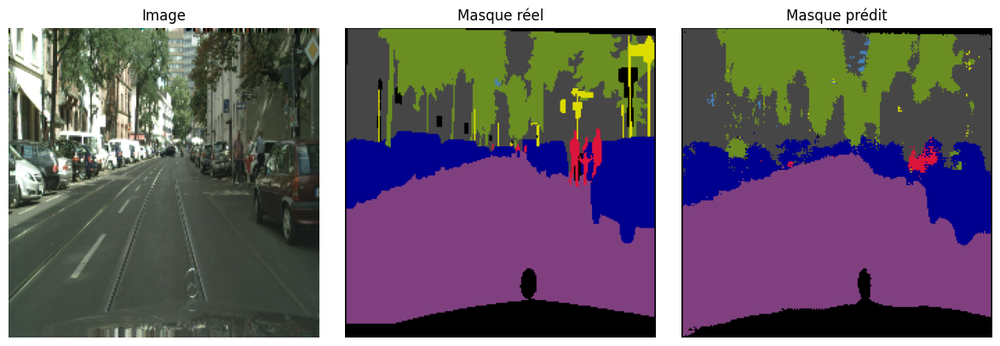

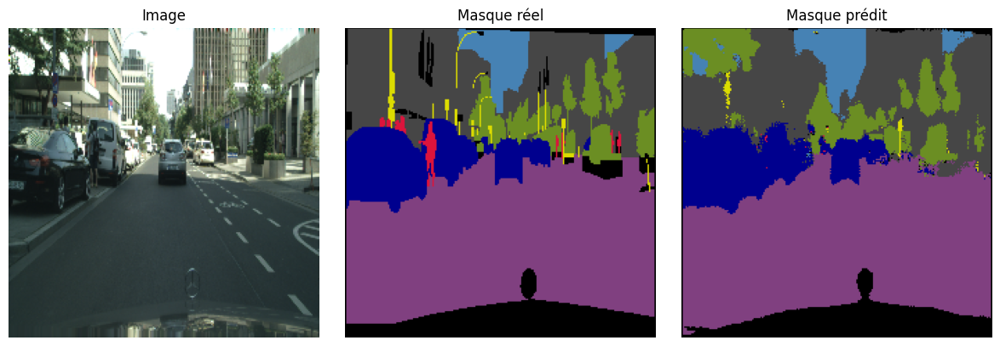

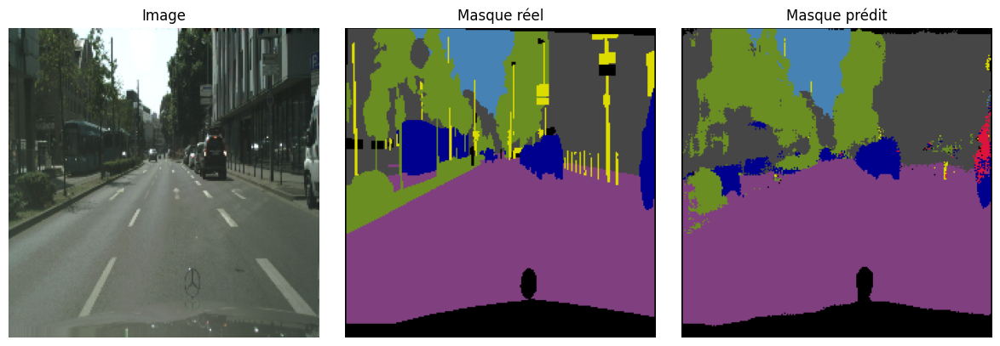

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def display_predictions(model, dataset, id_to_color, num_samples=3):
    """
    Affiche quelques prédictions du modèle U-Net sur un dataset

    Args:
        model: modèle entraîné (ex: VGG16-UNet)
        dataset: un dataset tf.data contenant (image, mask)
        id_to_color: tableau (num_classes, 3) pour la couleur par classe
        num_samples: nombre d'exemples à afficher
    """
    for images, masks in dataset.take(1):
        preds = model.predict(images)
        preds = tf.argmax(preds, axis=-1).numpy()       # (batch, H, W)

        for i in range(num_samples):
            image = images[i].numpy()
            true_mask = masks[i].numpy()
            pred_mask = preds[i]

            # Colorisation
            true_mask_rgb = id_to_color[true_mask]
            pred_mask_rgb = id_to_color[pred_mask]

            # Affichage
            plt.figure(figsize=(12, 4))

            plt.subplot(1, 3, 1)
            plt.imshow(image)
            plt.title("Image")
            plt.axis("off")

            plt.subplot(1, 3, 2)
            plt.imshow(true_mask_rgb)
            plt.title("Masque réel")
            plt.axis("off")

            plt.subplot(1, 3, 3)
            plt.imshow(pred_mask_rgb)
            plt.title("Masque prédit")
            plt.axis("off")

            plt.tight_layout()
            plt.show()
display_predictions(model, val_dataset, group_colors, num_samples=5)

### Test_4

In [31]:
import sys
sys.path.append("/content/drive/MyDrive/Colab Notebooks")  # Pour accéder aux fichiers personnalisés

from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from losses_and_metrics import (
    dice_metric,
    dice_loss_metric,
    cross_entropy_metric,
    total_loss
)
import tensorflow as tf

# 🔧 1. Construire le modèle avec ta fonction définie ailleurs
model = build_unet_vgg16(input_shape=(224, 224, 3), num_classes=8)

# 🔓 2. Débloquer les couches profondes (fine-tuning possible sur block5)
for layer in model.layers:
    if "block5" in layer.name:
        layer.trainable = True

# ✅ 3. Compilation avec un learning rate fixe
optimizer = tf.keras.optimizers.Adam(learning_rate=1e-4)

model.compile(
    optimizer=optimizer,
    loss=total_loss,
    metrics=[
        'accuracy',
        dice_metric,
        dice_loss_metric,
        cross_entropy_metric
    ]
)

# 🔁 4. Callbacks : early stopping, réduction de LR, checkpoint
early_stop = EarlyStopping(monitor='val_loss', patience=6, restore_best_weights=True, verbose=1)

reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, verbose=1)

model_ckpt = ModelCheckpoint(
    '/content/drive/MyDrive/unet_vgg16_best_V2.h5',
    monitor='val_loss',
    save_best_only=True,
    verbose=1
)

# 🚀 5. Entraînement
history = model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=60,
    callbacks=[early_stop, reduce_lr, model_ckpt]
)


Epoch 1/60
372/372 ━━━━━━━━━━━━━━━━━━━━ 0s 531ms/step - accuracy: 0.7048 - cross_entropy_metric: 0.9964 - dice_loss_metric: 0.3717 - dice_metric: 0.6283 - loss: 1.3681
Epoch 1: val_loss improved from inf to 0.79400, saving model to /content/drive/MyDrive/unet_vgg16_best_V2.h5


372/372 ━━━━━━━━━━━━━━━━━━━━ 249s 641ms/step - accuracy: 0.7050 - cross_entropy_metric: 0.9955 - dice_loss_metric: 0.3714 - dice_metric: 0.6286 - loss: 1.3669 - val_accuracy: 0.8286 - val_cross_entropy_metric: 0.5896 - val_dice_loss_metric: 0.2053 - val_dice_metric: 0.7947 - val_loss: 0.7940 - learning_rate: 1.0000e-04
Epoch 2/60
372/372 ━━━━━━━━━━━━━━━━━━━━ 0s 538ms/step - accuracy: 0.8528 - cross_entropy_metric: 0.4865 - dice_loss_metric: 0.1935 - dice_metric: 0.8065 - loss: 0.6800
Epoch 2: val_loss improved from 0.79400 to 0.72520, saving model to /content/drive/MyDrive/unet_vgg16_best_V2.h5


372/372 ━━━━━━━━━━━━━━━━━━━━ 237s 635ms/step - accuracy: 0.8528 - cross_entropy_metric: 0.4864 - dice_loss_metric: 0.1935 - dice_metric: 0.8065 - loss: 0.6799 - val_accuracy: 0.8416 - val_cross_entropy_metric: 0.5338 - val_dice_loss_metric: 0.1924 - val_dice_metric: 0.8076 - val_loss: 0.7252 - learning_rate: 1.0000e-04
Epoch 3/60
372/372 ━━━━━━━━━━━━━━━━━━━━ 0s 545ms/step - accuracy: 0.8671 - cross_entropy_metric: 0.4349 - dice_loss_metric: 0.1747 - dice_metric: 0.8253 - loss: 0.6096
Epoch 3: val_loss improved from 0.72520 to 0.67309, saving model to /content/drive/MyDrive/unet_vgg16_best_V2.h5


372/372 ━━━━━━━━━━━━━━━━━━━━ 251s 675ms/step - accuracy: 0.8671 - cross_entropy_metric: 0.4349 - dice_loss_metric: 0.1747 - dice_metric: 0.8253 - loss: 0.6096 - val_accuracy: 0.8521 - val_cross_entropy_metric: 0.4923 - val_dice_loss_metric: 0.1818 - val_dice_metric: 0.8182 - val_loss: 0.6731 - learning_rate: 1.0000e-04
Epoch 4/60
372/372 ━━━━━━━━━━━━━━━━━━━━ 0s 527ms/step - accuracy: 0.8755 - cross_entropy_metric: 0.4045 - dice_loss_metric: 0.1637 - dice_metric: 0.8363 - loss: 0.5683
Epoch 4: val_loss improved from 0.67309 to 0.65758, saving model to /content/drive/MyDrive/unet_vgg16_best_V2.h5


372/372 ━━━━━━━━━━━━━━━━━━━━ 242s 650ms/step - accuracy: 0.8755 - cross_entropy_metric: 0.4045 - dice_loss_metric: 0.1637 - dice_metric: 0.8363 - loss: 0.5682 - val_accuracy: 0.8550 - val_cross_entropy_metric: 0.4805 - val_dice_loss_metric: 0.1781 - val_dice_metric: 0.8219 - val_loss: 0.6576 - learning_rate: 1.0000e-04
Epoch 5/60
372/372 ━━━━━━━━━━━━━━━━━━━━ 0s 527ms/step - accuracy: 0.8811 - cross_entropy_metric: 0.3850 - dice_loss_metric: 0.1564 - dice_metric: 0.8436 - loss: 0.5414
Epoch 5: val_loss improved from 0.65758 to 0.62675, saving model to /content/drive/MyDrive/unet_vgg16_best_V2.h5


372/372 ━━━━━━━━━━━━━━━━━━━━ 245s 656ms/step - accuracy: 0.8811 - cross_entropy_metric: 0.3849 - dice_loss_metric: 0.1564 - dice_metric: 0.8436 - loss: 0.5413 - val_accuracy: 0.8614 - val_cross_entropy_metric: 0.4553 - val_dice_loss_metric: 0.1726 - val_dice_metric: 0.8274 - val_loss: 0.6268 - learning_rate: 1.0000e-04
Epoch 6/60
372/372 ━━━━━━━━━━━━━━━━━━━━ 0s 527ms/step - accuracy: 0.8859 - cross_entropy_metric: 0.3645 - dice_loss_metric: 0.1497 - dice_metric: 0.8503 - loss: 0.5142
Epoch 6: val_loss improved from 0.62675 to 0.62463, saving model to /content/drive/MyDrive/unet_vgg16_best_V2.h5


372/372 ━━━━━━━━━━━━━━━━━━━━ 243s 652ms/step - accuracy: 0.8859 - cross_entropy_metric: 0.3645 - dice_loss_metric: 0.1497 - dice_metric: 0.8503 - loss: 0.5142 - val_accuracy: 0.8628 - val_cross_entropy_metric: 0.4550 - val_dice_loss_metric: 0.1708 - val_dice_metric: 0.8292 - val_loss: 0.6246 - learning_rate: 1.0000e-04
Epoch 7/60
372/372 ━━━━━━━━━━━━━━━━━━━━ 0s 528ms/step - accuracy: 0.8914 - cross_entropy_metric: 0.3450 - dice_loss_metric: 0.1426 - dice_metric: 0.8574 - loss: 0.4875
Epoch 7: val_loss improved from 0.62463 to 0.60467, saving model to /content/drive/MyDrive/unet_vgg16_best_V2.h5


372/372 ━━━━━━━━━━━━━━━━━━━━ 245s 658ms/step - accuracy: 0.8914 - cross_entropy_metric: 0.3449 - dice_loss_metric: 0.1425 - dice_metric: 0.8575 - loss: 0.4875 - val_accuracy: 0.8660 - val_cross_entropy_metric: 0.4380 - val_dice_loss_metric: 0.1679 - val_dice_metric: 0.8321 - val_loss: 0.6047 - learning_rate: 1.0000e-04
Epoch 8/60
372/372 ━━━━━━━━━━━━━━━━━━━━ 0s 523ms/step - accuracy: 0.8959 - cross_entropy_metric: 0.3295 - dice_loss_metric: 0.1366 - dice_metric: 0.8634 - loss: 0.4661
Epoch 8: val_loss improved from 0.60467 to 0.59919, saving model to /content/drive/MyDrive/unet_vgg16_best_V2.h5


372/372 ━━━━━━━━━━━━━━━━━━━━ 240s 645ms/step - accuracy: 0.8959 - cross_entropy_metric: 0.3295 - dice_loss_metric: 0.1366 - dice_metric: 0.8634 - loss: 0.4661 - val_accuracy: 0.8670 - val_cross_entropy_metric: 0.4319 - val_dice_loss_metric: 0.1686 - val_dice_metric: 0.8314 - val_loss: 0.5992 - learning_rate: 1.0000e-04
Epoch 9/60
372/372 ━━━━━━━━━━━━━━━━━━━━ 0s 519ms/step - accuracy: 0.9000 - cross_entropy_metric: 0.3157 - dice_loss_metric: 0.1312 - dice_metric: 0.8688 - loss: 0.4469
Epoch 9: val_loss improved from 0.59919 to 0.59601, saving model to /content/drive/MyDrive/unet_vgg16_best_V2.h5


372/372 ━━━━━━━━━━━━━━━━━━━━ 241s 647ms/step - accuracy: 0.9000 - cross_entropy_metric: 0.3157 - dice_loss_metric: 0.1312 - dice_metric: 0.8688 - loss: 0.4469 - val_accuracy: 0.8681 - val_cross_entropy_metric: 0.4334 - val_dice_loss_metric: 0.1638 - val_dice_metric: 0.8362 - val_loss: 0.5960 - learning_rate: 1.0000e-04
Epoch 10/60
372/372 ━━━━━━━━━━━━━━━━━━━━ 0s 509ms/step - accuracy: 0.9047 - cross_entropy_metric: 0.2991 - dice_loss_metric: 0.1249 - dice_metric: 0.8751 - loss: 0.4241
Epoch 10: val_loss did not improve from 0.59601
372/372 ━━━━━━━━━━━━━━━━━━━━ 251s 619ms/step - accuracy: 0.9047 - cross_entropy_metric: 0.2991 - dice_loss_metric: 0.1249 - dice_metric: 0.8751 - loss: 0.4240 - val_accuracy: 0.8659 - val_cross_entropy_metric: 0.4466 - val_dice_loss_metric: 0.1680 - val_dice_metric: 0.8320 - val_loss: 0.6135 - learning_rate: 1.0000e-04
Epoch 11/60
372/372 ━━━━━━━━━━━━━━━━━━━━ 0s 506ms/step - accuracy: 0.9067 - cross_entropy_metric: 0.2931 - dice_loss_metric: 0.1222 - dice_me

372/372 ━━━━━━━━━━━━━━━━━━━━ 245s 658ms/step - accuracy: 0.9169 - cross_entropy_metric: 0.2561 - dice_loss_metric: 0.1093 - dice_metric: 0.8907 - loss: 0.3654 - val_accuracy: 0.8797 - val_cross_entropy_metric: 0.4080 - val_dice_loss_metric: 0.1469 - val_dice_metric: 0.8531 - val_loss: 0.5538 - learning_rate: 2.5000e-05
Epoch 15/60
372/372 ━━━━━━━━━━━━━━━━━━━━ 0s 528ms/step - accuracy: 0.9220 - cross_entropy_metric: 0.2397 - dice_loss_metric: 0.1029 - dice_metric: 0.8971 - loss: 0.3427
Epoch 15: val_loss did not improve from 0.55378
372/372 ━━━━━━━━━━━━━━━━━━━━ 238s 639ms/step - accuracy: 0.9220 - cross_entropy_metric: 0.2397 - dice_loss_metric: 0.1029 - dice_metric: 0.8971 - loss: 0.3427 - val_accuracy: 0.8786 - val_cross_entropy_metric: 0.4179 - val_dice_loss_metric: 0.1474 - val_dice_metric: 0.8526 - val_loss: 0.5641 - learning_rate: 2.5000e-05
Epoch 16/60
372/372 ━━━━━━━━━━━━━━━━━━━━ 0s 521ms/step - accuracy: 0.9241 - cross_entropy_metric: 0.2338 - dice_loss_metric: 0.1002 - dice_me

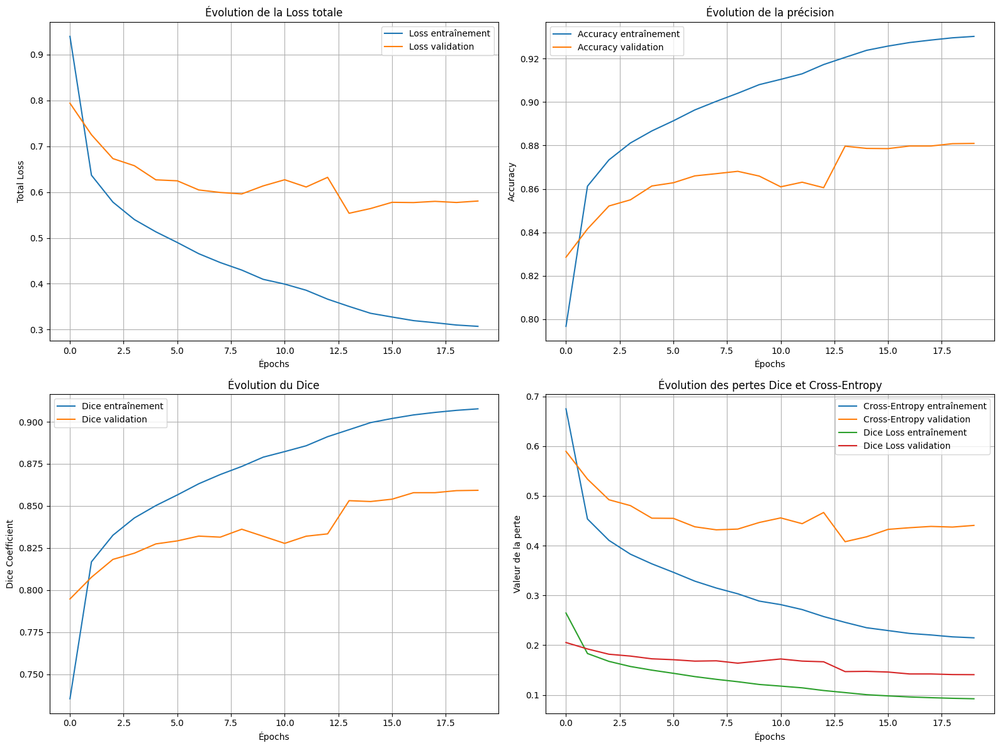

In [32]:
import matplotlib.pyplot as plt

def plot_full_training_history(history):
    """
    Affiche les courbes complètes de loss, accuracy, dice, cross_entropy et dice_loss
    """
    metrics = history.history.keys()
    plt.figure(figsize=(16, 12))

    # 1. Total Loss
    plt.subplot(2, 2, 1)
    plt.plot(history.history['loss'], label='Loss entraînement')
    plt.plot(history.history['val_loss'], label='Loss validation')
    plt.xlabel('Épochs')
    plt.ylabel('Total Loss')
    plt.title('Évolution de la Loss totale')
    plt.legend()
    plt.grid(True)

    # 2. Accuracy
    plt.subplot(2, 2, 2)
    if 'accuracy' in metrics:
        plt.plot(history.history['accuracy'], label='Accuracy entraînement')
        plt.plot(history.history['val_accuracy'], label='Accuracy validation')
        plt.ylabel('Accuracy')
        plt.title('Évolution de la précision')
        plt.xlabel('Épochs')
        plt.legend()
        plt.grid(True)

    # 3. Dice Score
    if 'dice_metric' in metrics:
        plt.subplot(2, 2, 3)
        plt.plot(history.history['dice_metric'], label='Dice entraînement')
        plt.plot(history.history['val_dice_metric'], label='Dice validation')
        plt.xlabel('Épochs')
        plt.ylabel('Dice Coefficient')
        plt.title('Évolution du Dice')
        plt.legend()
        plt.grid(True)

    # 4. Cross-Entropy et Dice Loss
    if 'cross_entropy_metric' in metrics and 'dice_loss_metric' in metrics:
        plt.subplot(2, 2, 4)
        plt.plot(history.history['cross_entropy_metric'], label='Cross-Entropy entraînement')
        plt.plot(history.history['val_cross_entropy_metric'], label='Cross-Entropy validation')
        plt.plot(history.history['dice_loss_metric'], label='Dice Loss entraînement')
        plt.plot(history.history['val_dice_loss_metric'], label='Dice Loss validation')
        plt.xlabel('Épochs')
        plt.ylabel('Valeur de la perte')
        plt.title('Évolution des pertes Dice et Cross-Entropy')
        plt.legend()
        plt.grid(True)

    plt.tight_layout()
    plt.show()

plot_full_training_history(history)

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


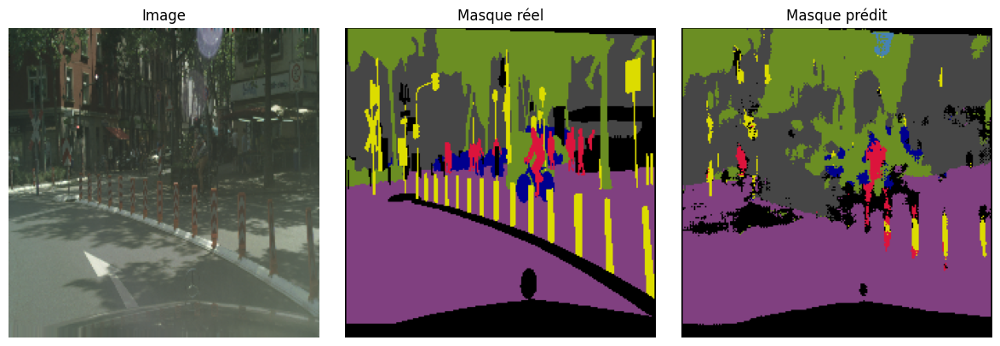

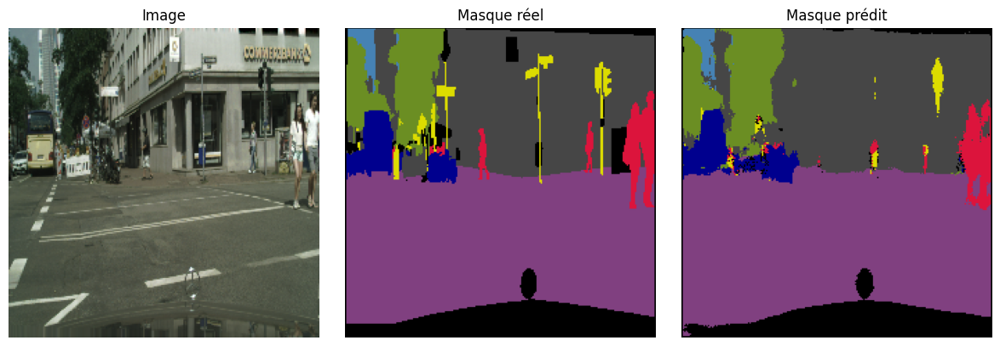

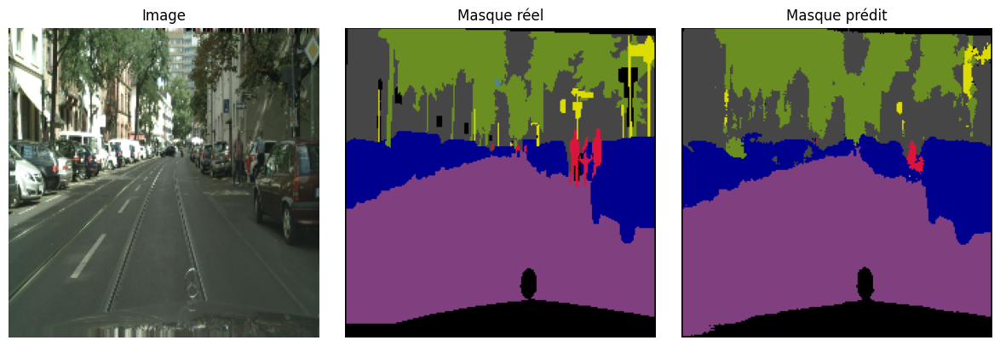

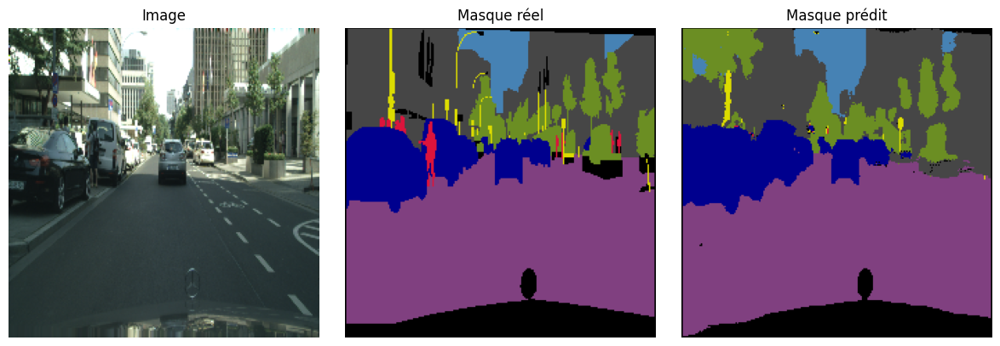

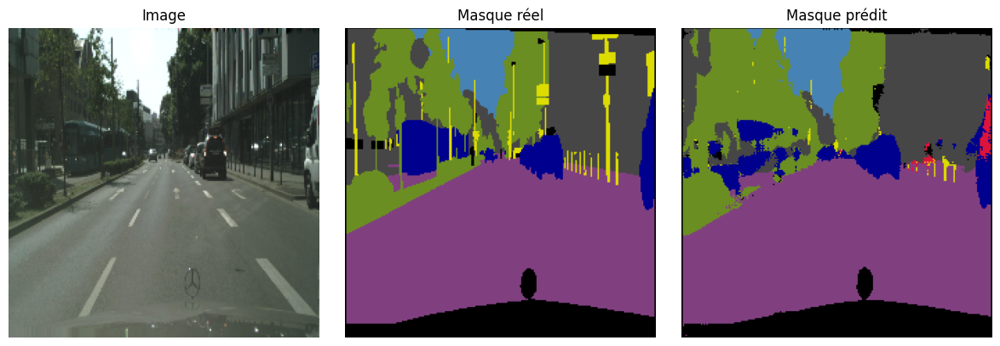

In [33]:
import matplotlib.pyplot as plt
import numpy as np

def display_predictions(model, dataset, id_to_color, num_samples=3):
    """
    Affiche quelques prédictions du modèle U-Net sur un dataset

    Args:
        model: modèle entraîné (ex: VGG16-UNet)
        dataset: un dataset tf.data contenant (image, mask)
        id_to_color: tableau (num_classes, 3) pour la couleur par classe
        num_samples: nombre d'exemples à afficher
    """
    for images, masks in dataset.take(1):
        preds = model.predict(images)
        preds = tf.argmax(preds, axis=-1).numpy()       # (batch, H, W)

        for i in range(num_samples):
            image = images[i].numpy()
            true_mask = masks[i].numpy()
            pred_mask = preds[i]

            # Colorisation
            true_mask_rgb = id_to_color[true_mask]
            pred_mask_rgb = id_to_color[pred_mask]

            # Affichage
            plt.figure(figsize=(12, 4))

            plt.subplot(1, 3, 1)
            plt.imshow(image)
            plt.title("Image")
            plt.axis("off")

            plt.subplot(1, 3, 2)
            plt.imshow(true_mask_rgb)
            plt.title("Masque réel")
            plt.axis("off")

            plt.subplot(1, 3, 3)
            plt.imshow(pred_mask_rgb)
            plt.title("Masque prédit")
            plt.axis("off")

            plt.tight_layout()
            plt.show()
display_predictions(model, val_dataset, group_colors, num_samples=5)